In [1]:
# from numpy import*
from pylab import*
import matplotlib.pyplot as plt
from h5py import File
import pandas as pd
from slab.dsfit import*
from slab import*
import json
import numpy as np
from datetime import datetime
import scipy as sc
from scipy.optimize import curve_fit
from scipy.signal import argrelextrema
from h5py import File
import os
from slab.dataanalysis import get_next_filename
import math
import scipy.special
from scipy.stats import poisson

Warning could not load Chase AWG dll, check that dll located at 'C:\_Lib\python\slab\instruments\awg\chase\dax22000_lib_DLL32.dll'
Could not load InstrumentManagerWindow
Warning could not load LDA labbrick dll, check that dll located at 'C:\_Lib\python\slab\instruments\labbrick\VNX_atten.dll'
Warning could not load LMS labbrick dll, check that dll located at 'C:\_Lib\python\slab\instruments\labbrick\vnx_fmsynth.dll'
Warning could not load LPS labbrick dll, check that dll located at 'C:\_Lib\python\slab\instruments\labbrick\VNX_dps.dll'
Could not load labbrick


C:\ProgramData\Miniconda3\lib\site-packages\IPython\qt.py:12: ShimWarning: The `IPython.qt` package has been deprecated since IPython 4.0. You should import from qtconsole instead.
  warn("The `IPython.qt` package has been deprecated since IPython 4.0. "
C:\ProgramData\Miniconda3\lib\site-packages\visa.py:13: FutureWarning: The visa module provided by PyVISA is being deprecated. You can replace `import visa` by `import pyvisa as visa` to achieve the same effect.

The reason for the deprecation is the possible conflict with the visa package provided by the https://github.com/visa-sdk/visa-python which can result in hard to debug situations.
  warnings.warn(


# Fit functions

In [2]:
def coherent_state(n, alpha):
    return np.exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)

def line(x, m, b):
    return m*x+b

def proportional(x, m):
    return m * x

def gfromchi(chi,alpha,delta):
    return np.sqrt(chi*delta*(delta+alpha)/alpha)

def gaussfuncsum(p, x):
    """p[0]+p[1]/(1+(x-p[2])**2/p[3]**2)"""
    y = 0
    for ii in range(N):
        y = y + p[3*ii+1]*exp(-(x-(p[3*ii+2]))**2/2/p[3*ii+3]**2)
    return y

def gaussfuncsum_with_baseline(x, *args):
    """p[0]+p[1]/(1+(x-p[2])**2/p[3]**2)"""
    y = 0 
    p = args
#     print(len(p))
    for ii in range(N):
        y = y + p[3*ii+1]*exp(-(x-(p[3*ii+2]))**2/2/p[3*ii+3]**2)
    y += p[0]
    return y
def fitgausssum(xdata, ydata, fitparams=None, domain=None, showfit=False,
                showstartfit=False, label="", debug=False):
    """fit lorentzian:
        returns [offset,amplitude,center,hwhm]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata, ydata, domain)
    else:
        fitdatax = xdata
        fitdatay = ydata
    
    if fitparams is None:
        fitparams = 0*ones(3*N+1)
        fitparams[0] = (fitdatay[0] + fitdatay[-1])/2.
        fitparams[1] = max(fitdatay) - min(fitdatay)
        fitparams[2] = fitdatax[np.argmax(fitdatay)]
        fitparams[3] = (max(fitdatax) - min(fitdatax))/10.
    
    if debug==True: 
        print(fitparams)
        
    p1 = fitgeneral(fitdatax, fitdatay, gaussfuncsum, fitparams, domain=None, showfit=showfit, 
                    showstartfit=showstartfit, label=label)
    p1[3]=abs(p1[3])
    
    return p1

def fitgausssum_with_baseline(xdata, ydata, fitparams=None):
    """fit lorentzian:
        returns [offset,amplitude,center,hwhm]"""
    fitdatax = xdata
    fitdatay = ydata
#     if fitparams is None:
#         fitparams = 0*ones(3*N+1)
#         fitparams[0] = (fitdatay[0]+fitdatay[-1])/2.
#         fitparams[1] = max(fitdatay)-min(fitdatay)
#         fitparams[2] = fitdatax[np.argmax(fitdatay)]
#         fitparams[3] = (max(fitdatax)-min(fitdatax))/10.
    
#     p1 = fitgeneral(fitdatax, fitdatay, gaussfuncsum_with_baseline, fitparams, domain=None, showfit=showfit,
#                     showstartfit=showstartfit, label=label)
#     bounds=(0, [3., 1., 0.5])
        
    popt, pcov = curve_fit(gaussfuncsum_with_baseline, fitdatax, fitdatay, p0=fitparams, bounds=(0, np.inf))

    return popt, pcov

def fitamp(p1):
    fitamparray = []
    fitfreqarray = []
    n_peaks = int((len(p1)-1)/3)
    for i in range(n_peaks):
        fitamparray.append(p1[3*i+1])
        fitfreqarray.append(p1[3*i+2])
    return fitamparray , fitfreqarray

def fitcoherentstate(peak_val):
    xdata = np.arange(len(peak_val))
    ydata = peak_val
    popt, pcov = curve_fit(coherent_state, xdata, ydata)
    return popt[0], np.sqrt(pcov[0][0])

def expfunc2(x, p):
    """p[0]+p[1]*exp(-(x-p[2])/p[3])"""
    return p[0]*np.exp**(-(x-p[1])/p[2])

def fitexp2(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fit exponential decay (p[0]*exp(-(x-p[1])/p[2]))"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        fitparams=[0.,0.,0.,0.]
        fitparams[0]=fitdatay[0]-fitdatay[-1]
        fitparams[1]=fitdatax[0]
        fitparams[2]=(fitdatax[-1]-fitdatax[0])/5.
    #print fitparams
    p1 = fitgeneral(fitdatax, fitdatay, expfunc2, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1   

def expfunc_test(x, a, b, c):
    return b*np.exp(-(x-a)/c)

def expfunc_baseline(x, a, b, c):
    return a*np.exp(-x/b) + c

def doublegauss(bins, *p):
    a1, sigma1, mu1 = p[0], p[1], p[2]
    a2, sigma2, mu2 = p[3], p[4], p[5]

    y1 = a1*((1 / (np.sqrt(2 * np.pi) * sigma1)) *
     np.exp(-0.5 * (1 / sigma1 * (bins - mu1))**2))
    y2 = a2*((1 / (np.sqrt(2 * np.pi) * sigma2)) *
     np.exp(-0.5 * (1 / sigma2 * (bins - mu2))**2))
    y = y1+y2
    
    return y
def gaussian2d(x, y, x0, y0, xalpha, yalpha, A):
    return A * np.exp( -((x-x0)/xalpha)**2 -((y-y0)/yalpha)**2)


def hist(filename=None, data=None, plot=True, ran=1.0):
    
    if data == None:
        with File(filename,'r') as a:
            ig = array(a['ig'])
            qg = array(a['qg'])
            ie = array(a['ie'])
            qe = array(a['qe'])
            a.close()
    else:
        ig = data[0]
        qg = data[1]
        ie = data[2]
        qe = data[3]

    numbins = 200
    
    xg, yg = np.median(ig), np.median(qg)
    xe, ye = np.median(ie), np.median(qe)

    if plot==True:
        fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))
        fig.tight_layout()

        axs[0].scatter(ig, qg, label='g', color='b', marker='*')
        axs[0].scatter(ie, qe, label='e', color='r', marker='*')
        axs[0].scatter(xg, yg, color='k', marker='o')
        axs[0].scatter(xe, ye, color='k', marker='o')
        axs[0].set_xlabel('I (a.u.)')
        axs[0].set_ylabel('Q (a.u.)')
        axs[0].legend(loc='upper right')
        axs[0].set_title('Unrotated')
        axs[0].axis('equal')
    """Compute the rotation angle"""
    theta = -arctan((ye-yg)/(xe-xg))
    """Rotate the IQ data"""
    ig_new = ig*cos(theta) - qg*sin(theta)
    qg_new = ig*sin(theta) + qg*cos(theta) 
    ie_new = ie*cos(theta) - qe*sin(theta)
    qe_new = ie*sin(theta) + qe*cos(theta)
    
    """New means of each blob"""
    xg, yg = np.median(ig_new), np.median(qg_new)
    xe, ye = np.median(ie_new), np.median(qe_new)

    xlims = [xg-ran, xg+ran]
    ylims = [yg-ran, yg+ran]

    if plot==True:
        axs[1].scatter(ig_new, qg_new, label='g', color='b', marker='*')
        axs[1].scatter(ie_new, qe_new, label='e', color='r', marker='*')
        axs[1].scatter(xg, yg, color='k', marker='o')
        axs[1].scatter(xe, ye, color='k', marker='o')    
        axs[1].set_xlabel('I (a.u.)')
        axs[1].legend(loc='upper right')
        axs[1].set_title('Rotated')
        axs[1].axis('equal')

        """X and Y ranges for histogram"""
        
        ng, binsg, pg = axs[2].hist(ig_new, bins=numbins, range = xlims, color='b', label='g', alpha=0.5)
    #     popt, pcov = curve_fit(doublegauss, xdata=binsg[:-1], ydata=ng, p0=p0)
    #     mu_g = popt[2]
    #     axs[2].plot(binsg, doublegauss(binsg, *popt), 'k--', linewidth=2 )
        ne, binse, pe = axs[2].hist(ie_new, bins=numbins, range = xlims, color='r', label='e', alpha=0.5)
    #     popt, pcov = curve_fit(doublegauss, xdata=binse[:-1], ydata=ne, p0=p0)
    #     mu_e = popt[5]
    #     axs[2].plot(binse, doublegauss(binse, *popt), 'k--', linewidth=2 )
    #     axs[2].text(0.5*(mu_g + mu_e), 0.3*np.max(ne), "$\mu_{g}$ = %.4f \n $\mu_{e}$ = %.4f"%(mu_g, mu_e), fontsize=16)

        axs[2].set_xlabel('I(a.u.)')        
        fig.show()
        
    else:        
        ng, binsg = np.histogram(ig_new, bins=numbins, range = xlims)
        ne, binse = np.histogram(ie_new, bins=numbins, range = xlims)

    """Compute the fidelity using overlap of the histograms"""
    fid = np.abs(((np.cumsum(ng) - np.cumsum(ne)) / (0.5*ng.sum() + 0.5*ne.sum()))).max()

    return fid, theta

def rot_data(i, q, hist_filename=None):
    
    fid, theta = hist(hist_filename, ran=0.1)
    print(fid, theta)
    """Rotate the IQ data"""
    i_new = i*cos(theta) - q*sin(theta)
    q_new = i*sin(theta) + q*cos(theta) 
    
    return (i_new, q_new)


def ramsfit(tR, n0, phi0, a):
    T2 = 120e-6
    dephase = 1/T2
    detune = 2*np.pi*1e6 
    chi = 2*np.pi*380e3
    kappa = 2*np.pi*(8.0517e9)/8800
    tau = []
    z = []
    res = []
    for i,t in enumerate(tR):
        tau.append((1-np.exp(-complex(kappa*tR[i], 2*chi*tR[i])))/complex(kappa, 2*chi))
        z.append(np.exp(complex(-dephase*tR[i] , phi0 - detune*tR[i] - 2*n0*chi*tau[i])))
        res.append(a*0.5*(1-np.imag(z[i])))
    return np.array(res)

def cav_response_new(p, x):
    """(p[0]/p[1])/(-1/2*p[0]/p[1] - 1j*(x-p[0])"""
    ### p[0]=center freq, p[1]=kappa
    temp = (p[1])/(p[1] - 1j*(x-p[0]))
    return temp/max(abs(temp))

def IF_window(p,x):
    ### p[0] = center freq, p[1] = window width
    temp = zeros(len(x)) + 1j*zeros(len(x))
    for ii in range(len(x)):
        if x[ii]>(p[0]-p[1]) and x[ii]<(p[0]+p[1]):
            temp[ii] = 1/sqrt(2)*(1+1j)
        else:
            pass
    return temp/max(abs(temp))

def erf_t(A, sig, tc, tb, t):
    #A-Amplitude, sig-Gaussian Filter Width, tc-Core Pulse length, tb - zero-amplitude buffer length
    return (A/2)*(sc.special.erf((t-tb)/(sqrt(2)*sig))-sc.special.erf((t-tc-tb)/(sqrt(2)*sig)))

# Resonator spectropscopy

fits =  [-7.22626340e-07  7.37545529e-04  8.05183773e+00  4.77002479e-04]
fits =  [-2.64383918e-07  5.45579242e-05  8.05185573e+00  4.81546863e-04]
fits =  [-1.44971726e-06  3.70118176e-04  8.05183470e+00  4.82774553e-04]
fits =  [-1.20064674e-05  1.38354499e-03  8.05182762e+00  5.62123341e-04]


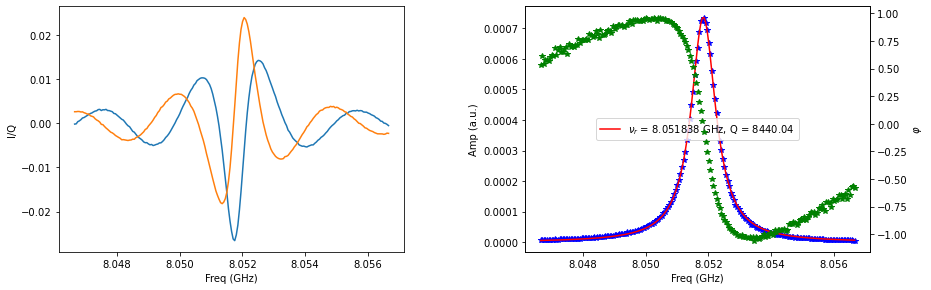

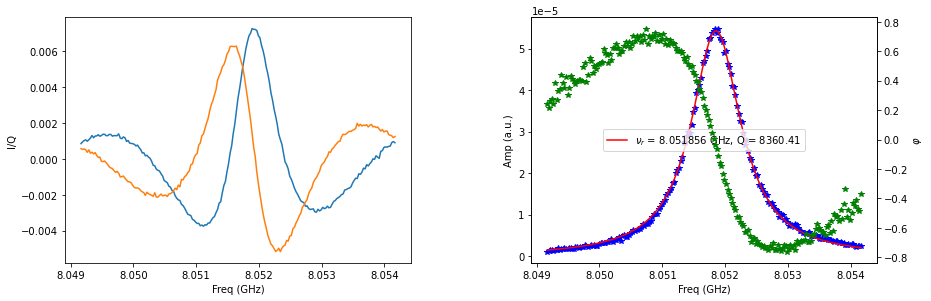

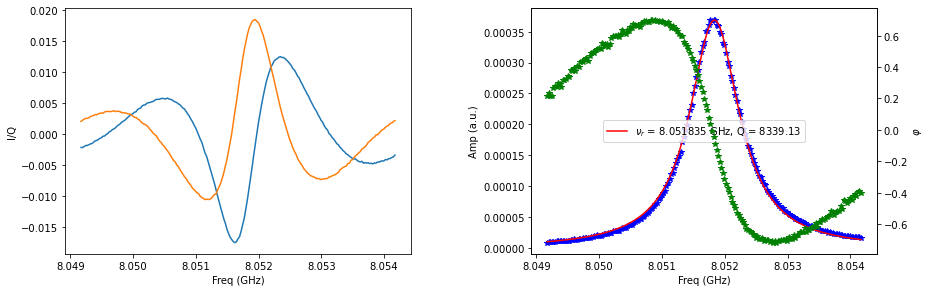

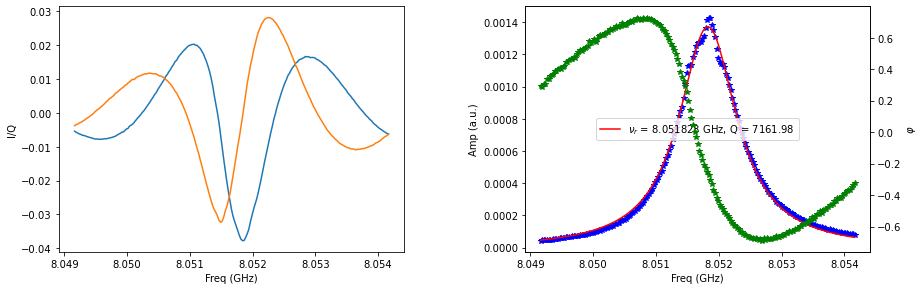

In [3]:
expt_name = 'resonator_spec'
filelist = [0, 40, 75, 91]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

## Optimal shape

fits =  [-1.25324606e-06  8.62685110e-05  8.05184589e+00  4.76398077e-04]
fits =  [-1.11704685e-06  1.49950453e-04  8.05184245e+00  4.51921451e-04]
fits =  [-1.55207372e-06  1.28742081e-04  8.05184644e+00  4.76766681e-04]


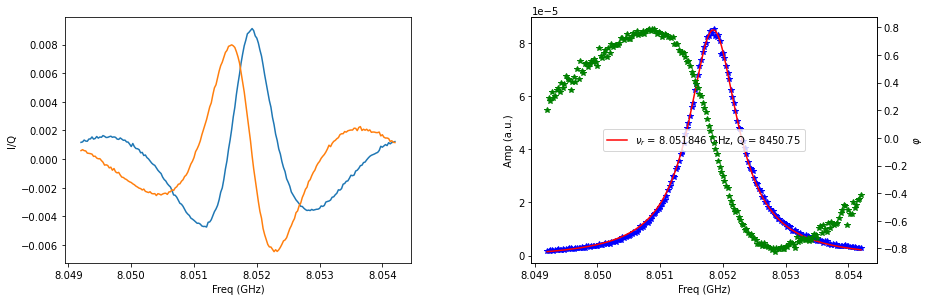

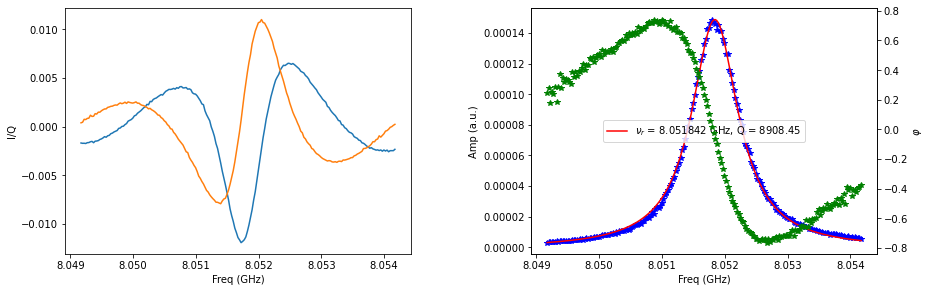

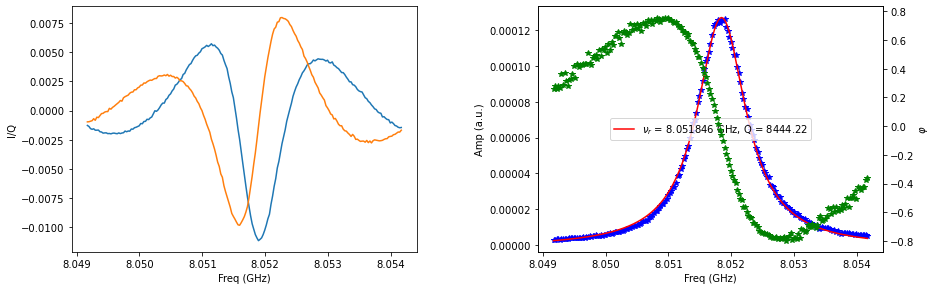

In [49]:
expt_name = 'resonator_spec_opt'
filelist = [0, 6, 20]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

## JPA

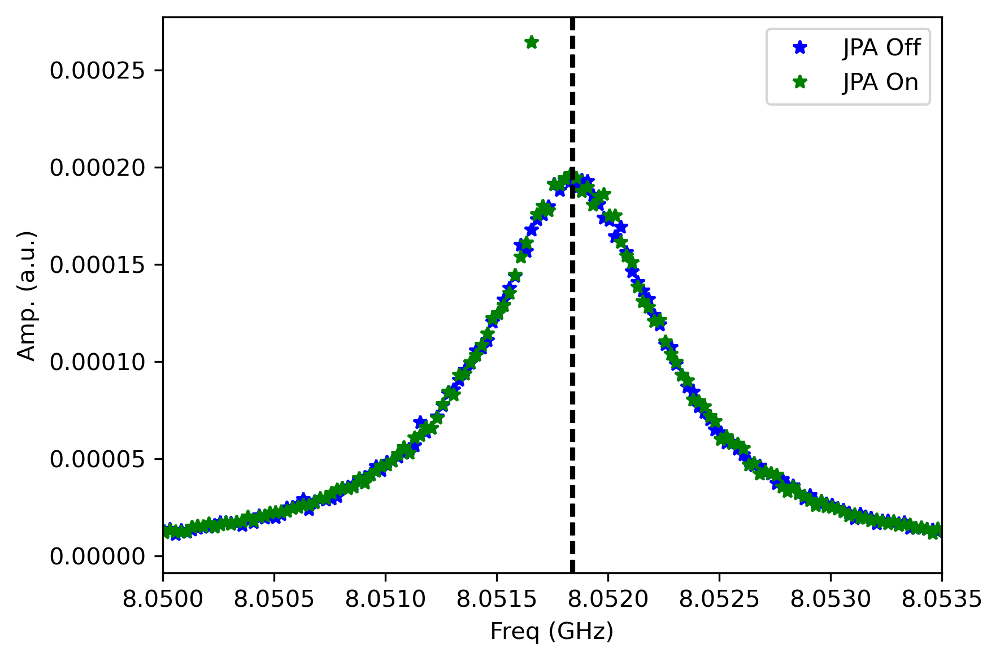

In [5]:
expt_name = 'resonator_jpa'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='JPA Off')
    ax1.plot(f, amps_e, 'g*', label='JPA On')
    ax1.set_xlim(8.05, 8.0535)
    pg = fitlor(f, amps_g, showfit=False)
#     ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
#     ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
#     plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
#     plt.ylim(0, 25e-5)
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

# Resonator chi

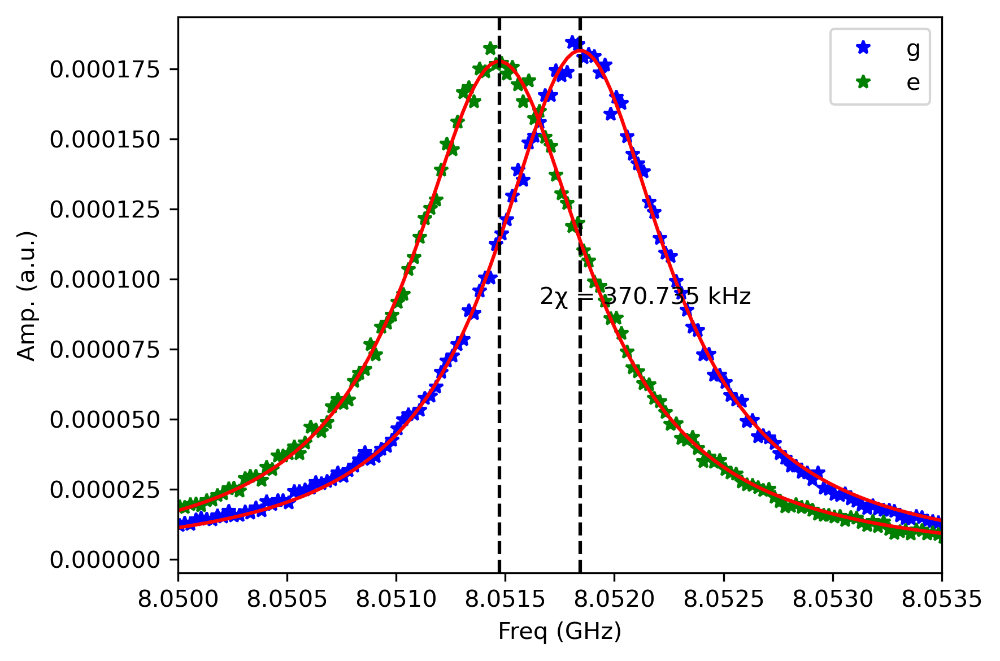

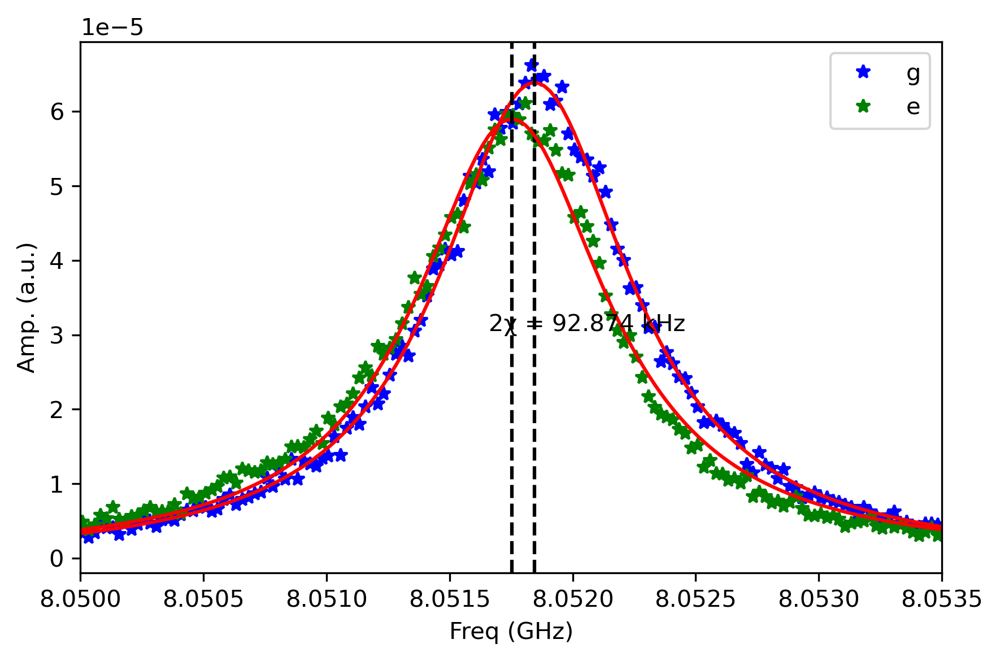

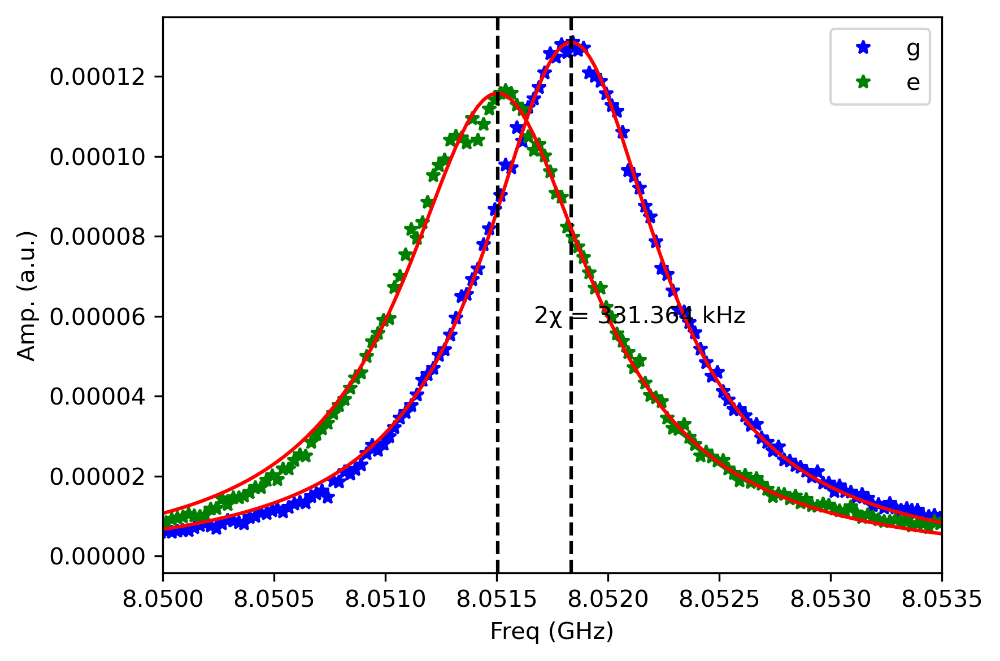

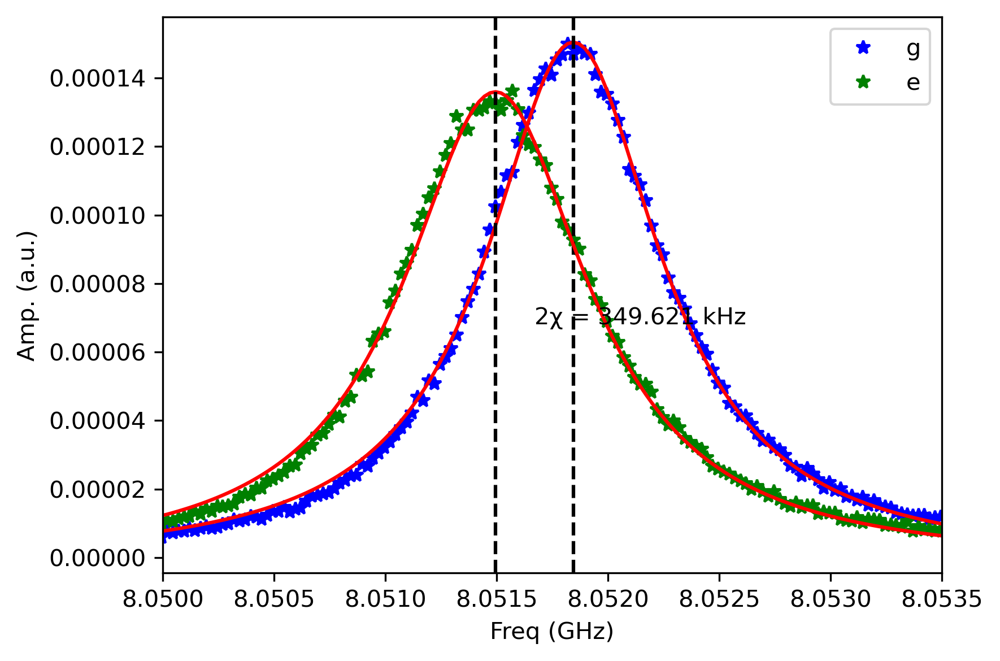

In [6]:
expt_name = 'resonator_chi'
filelist = [2, 3,  19, 27]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='g')
    ax1.plot(f, amps_e, 'g*', label='e')
    ax1.set_xlim(8.05, 8.0535)
    pg = fitlor(f, amps_g, showfit=False)
    ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
    ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
    plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

## Optimal pulse

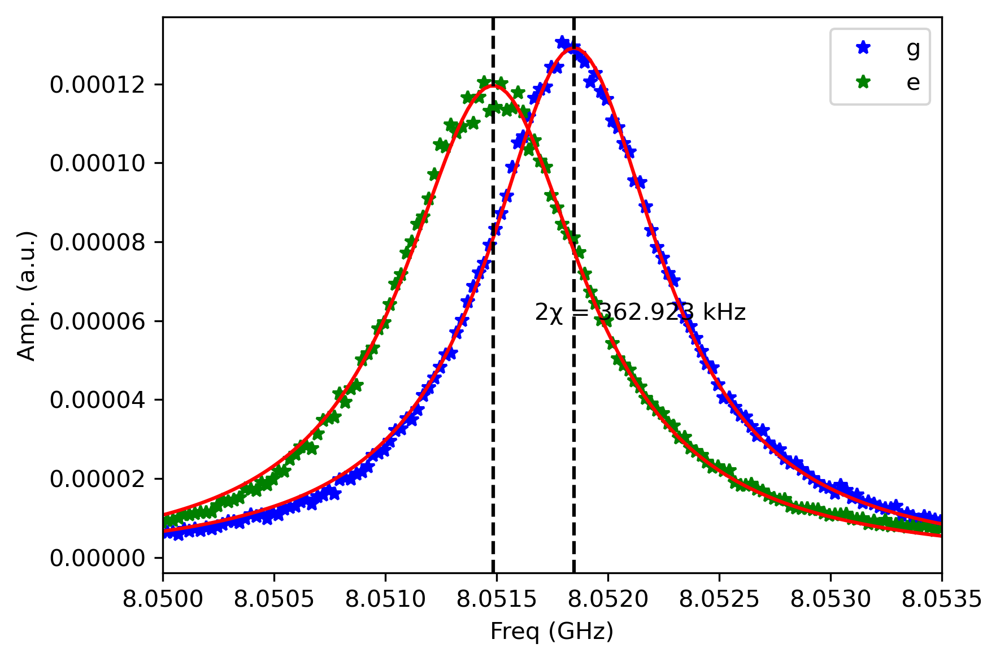

In [16]:
expt_name = 'resonator_chi_opt'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='g')
    ax1.plot(f, amps_e, 'g*', label='e')
    ax1.set_xlim(8.05, 8.0535)
    pg = fitlor(f, amps_g, showfit=False)
    ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
    ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
    plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

In [17]:
0.5*(pg[2]+ pe[2])

8.051665272161907

# Qubit Spectroscopy

fits =  [-2.53528334e-02  1.81586693e-03  4.74691305e+00  8.98604266e-04]
fits =  [-1.09406090e-02  5.09859716e-04  4.74702249e+00  4.99189912e-04]


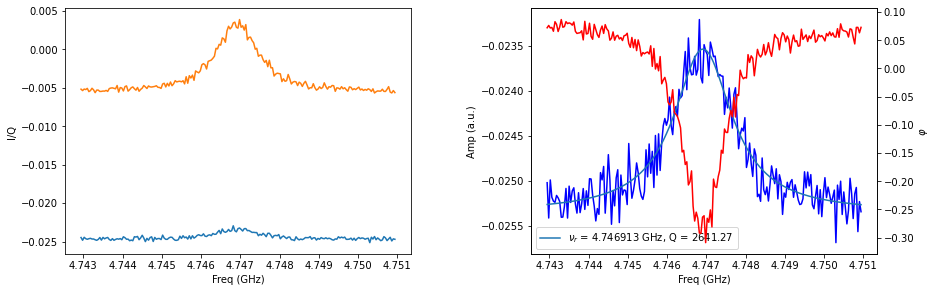

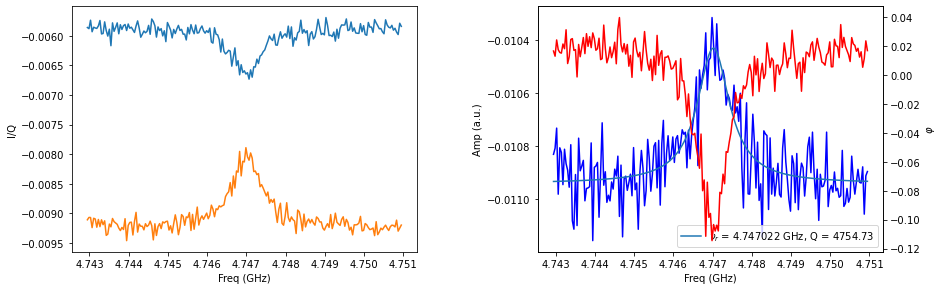

In [32]:
expt_name = 'ge_spectroscopy'
filelist = [0, 56]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')
    amps = -np.sqrt(np.array(I)**2 + 1*np.array(Q)**2)
#     amps = Q
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b-')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q))
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'r-')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='best')

## ef spectroscopy

fits =  [-1.10580532e-02  1.55508104e-03  4.60762007e+00  4.39600940e-03]


C:\ProgramData\Miniconda3\lib\site-packages\scipy\optimize\minpack.py:475: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  warnings.warn(errors[info][0], RuntimeWarning)


fits =  [-1.02067708e-02  1.27368598e-03  4.60388416e+00  1.76227372e-05]


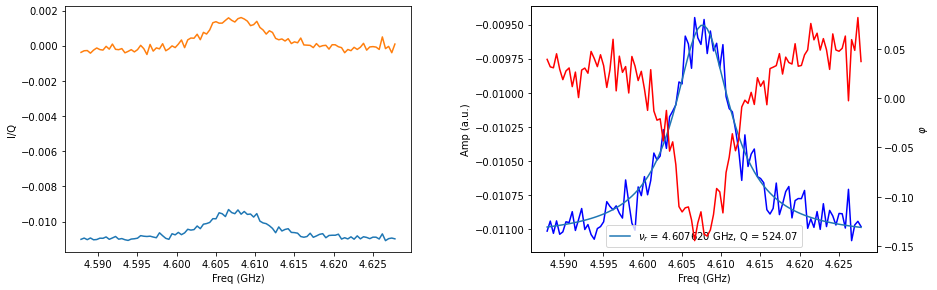

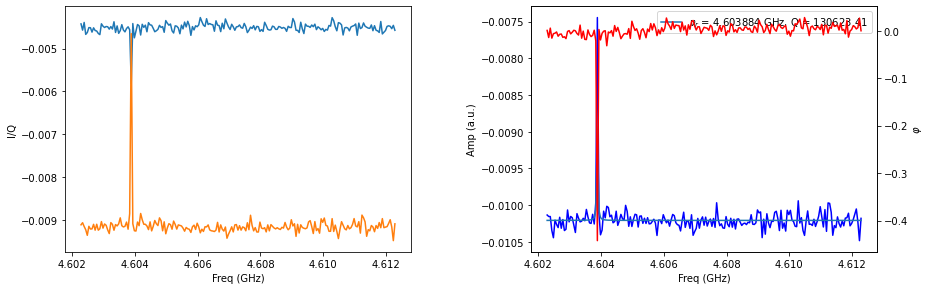

In [422]:
expt_name = 'ef_spectroscopy'
filelist = [0, 3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')
    amps = -np.sqrt(np.array(I)**2 + 1*np.array(Q)**2)
#     amps = Q
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b-')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q))
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'r-')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='best')

# Power Rabi

Suggested π amp = 0.3506
0.811 0.162
Suggested π amp = 0.3741
0.9475 0.006


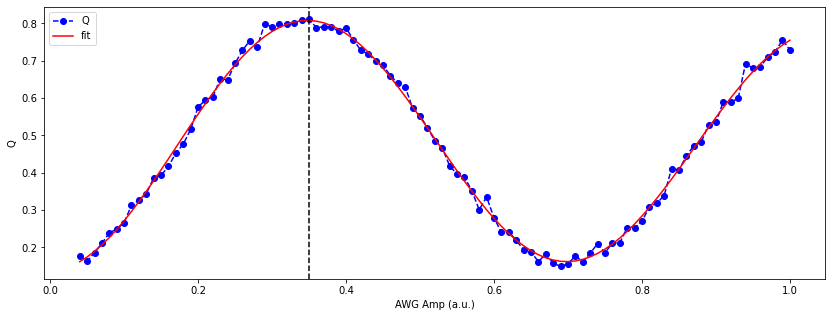

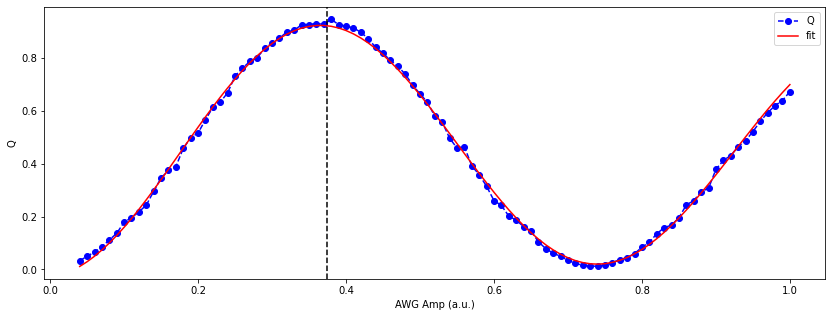

In [292]:
expt_name = 'power_rabi'
filelist = [111, 337]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[4:]
        x = x[4:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        
        print(max(Q), Q[0])

In [57]:
42340-42783

-443

In [66]:
(np.exp(-100/681))*78.78

68.0209862864917

## ef Power Rabi

Suggested π amp = 0.4152
-0.000581551116 -0.0009453247376
Suggested π amp = 0.3210
0.9855 0.05


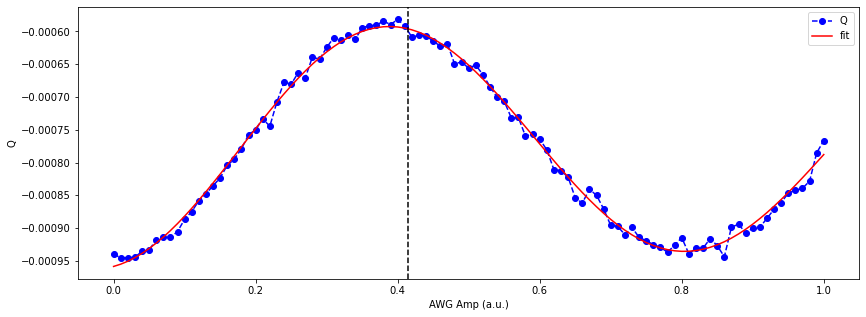

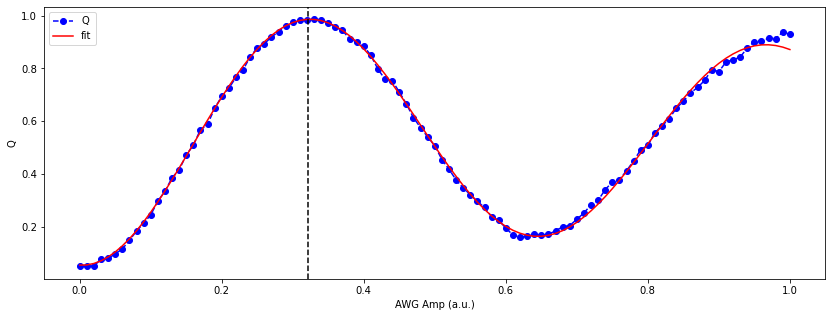

In [179]:
expt_name = 'ef_power_rabi'
filelist = [1, 12]
freq = []
t2 = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## ge Weak Rabi

Suggested π amp = 0.0037
0.7353 0.0235
Suggested π amp = 0.0037
0.951 0.006


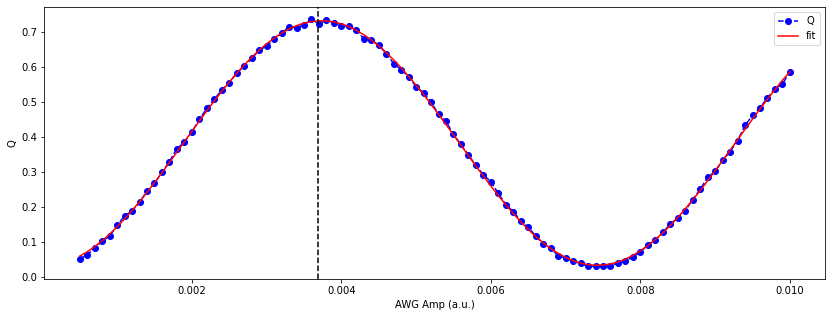

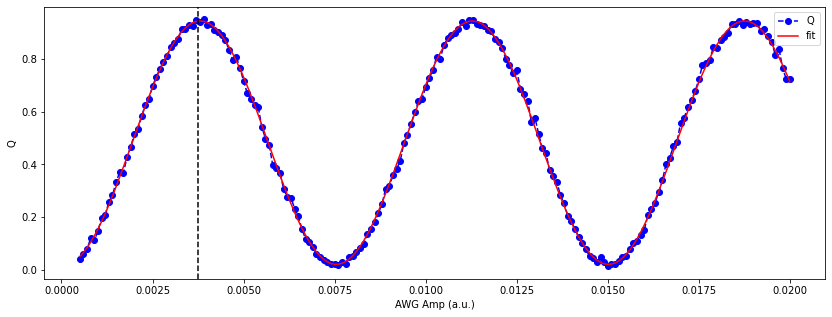

In [169]:
expt_name = 'weak_rabi'
filelist = [1, 47]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[5:]
        x = x[5:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## ge weak Rabi in the presence of a photon in the storage

Suggested π amp = 0.0050
0.8906752411576 0.0192926045016


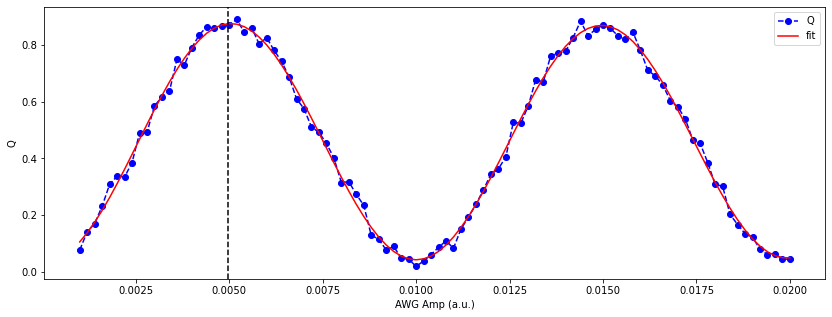

In [30]:
expt_name = 'weak_rabi_storage'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[5:]
        x = x[5:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

# Time Rabi

# T1

T1: 99.926 μs
0.831 0.046
T1: 106.080 μs
0.811 0.059
T1: 105.762 μs
0.0067890068889 0.0002487095557
T1: 22.645 μs
0.0047905249298 0.0013330119625


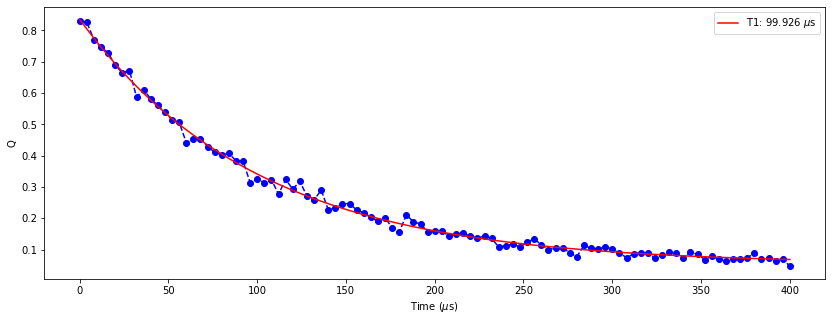

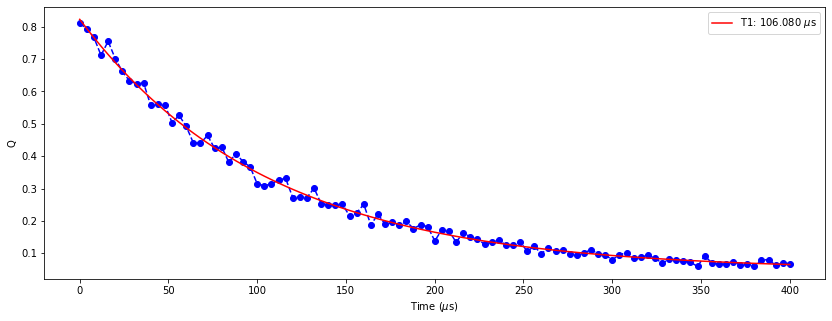

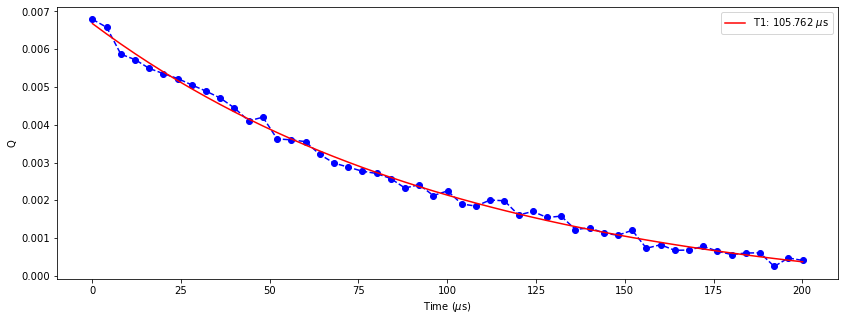

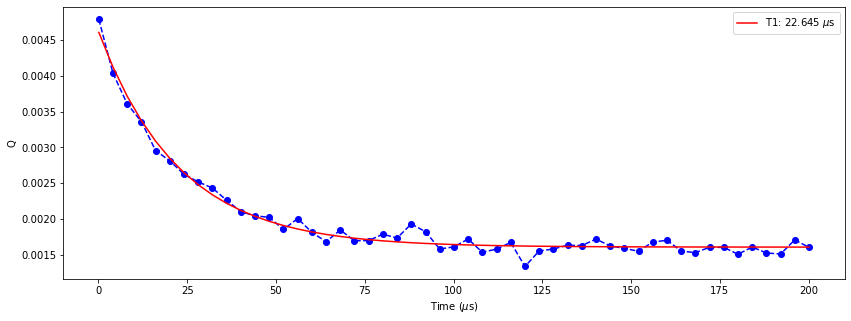

In [14]:
expt_name = 't1'
filelist = [34, 35, 52, 55]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q
        p = fitexp(x, y, showfit=False)
        print("T1: %.3f μs"%(p[3]))
        ax.plot(x, y, 'bo--')
        ax.plot(x[:], expfunc(p, x[:]), 'r-', label='T1: %.3f $\mu$s'%(p[3]))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## ef T1

T1: 39.512 μs


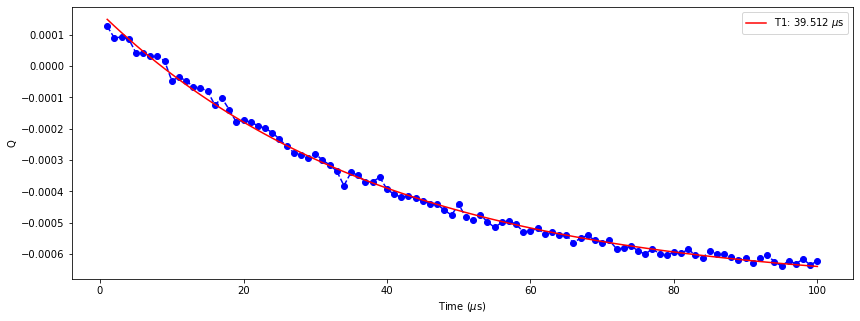

In [15]:
expt_name = 'ef_t1'
filelist = [1]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['times'])/1e3
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = I
        p = fitexp(x, y, showfit=False)
        print("T1: %.3f μs"%(p[3]))
        ax.plot(x, y, 'bo--')
        ax.plot(x[:], expfunc(p, x[:]), 'r-', label='T1: %.3f $\mu$s'%(p[3]))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()


## Storage T1

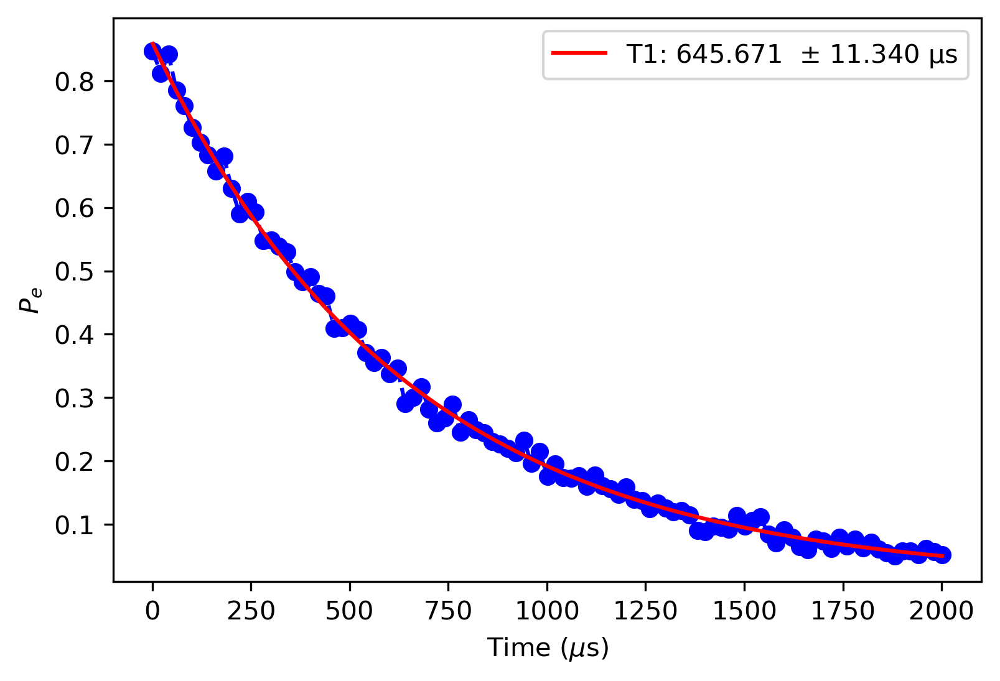

In [9]:
expt_name = 'storage_t1'
filelist = [10]
cal = [0.949, 0.011]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        fig, ax = plt.subplots(1, 1, dpi=300)

#         y = (Q - cal[1])/cal[0]
        y = Q

        popt, pcov = curve_fit(expfunc_baseline, x, y)
        ax.plot(x, y, 'bo--')
        ax.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(popt[1], np.sqrt(np.diag(pcov)[1])))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(r'$P_{e}$')
        ax.legend()
        plt.show()


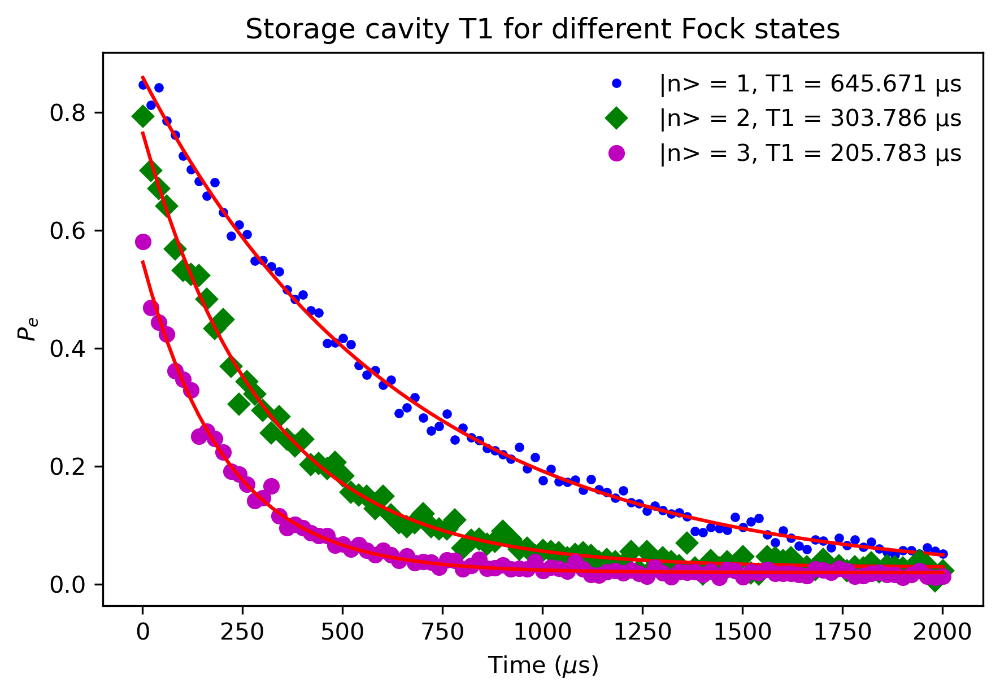

In [27]:
expt_name = 'storage_t1'
filelist = [10, 11, 12]
cal = [0.949, 0.011]
fig, ax = plt.subplots(1, 1, dpi=300)

marker = ['b.', 'gD', 'mo']
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        y = Q

        popt, pcov = curve_fit(expfunc_baseline, x, y)
        ax.plot(x, y, marker[ii], label=r"|n> = {}, T1 = {:.3f} μs".format(ii+1, popt[1]))
        ax.plot(x, expfunc_baseline(x, *popt), 'r-' )
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(r'$P_{e}$')

ax.legend(loc='best', frameon=False)
fig.tight_layout()
plt.title('Storage cavity T1 for different Fock states')
# plt.savefig('../plots/20210604-Storage-T1decay_Fock.png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

# ge Ramsey Phase

Original qubit frequency choice = 4.746910599438208 GHz
Oscillation freq =  0.0999671987344142  MHz
Offset freq = 3.280126558580232e-05 MHz
Suggested qubit frequency choice = 4.746910632239474 GHz
T2* = 128.90311883078616 us
Original qubit frequency choice = 4.746947661357474 GHz
Oscillation freq =  0.09987720546352195  MHz
Offset freq = 0.00012279453647805194 MHz
Suggested qubit frequency choice = 4.7469477841520105 GHz
T2* = 102.67797359319692 us


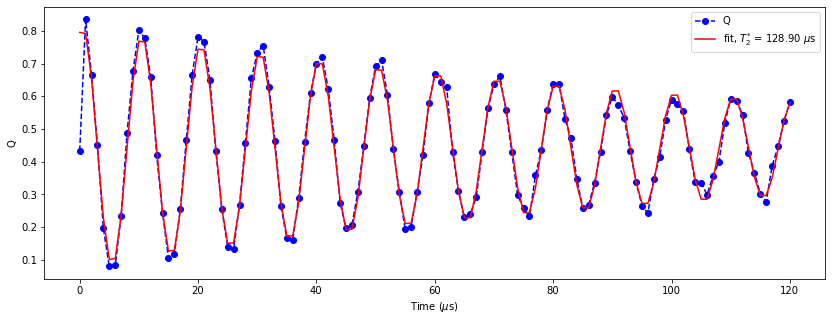

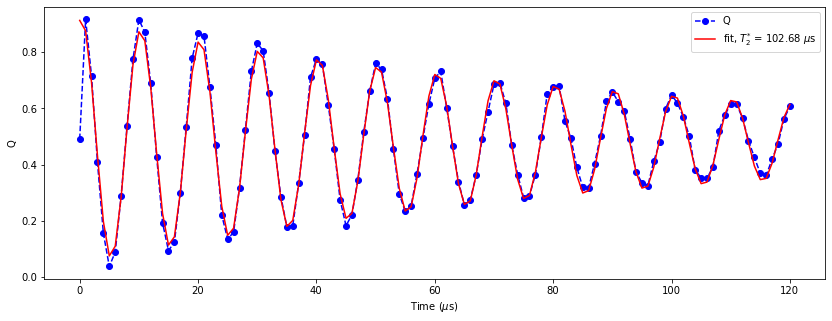

In [5]:
expt_name = 'Ramsey_phase'
filelist = [28, 348]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['qubit_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

## ef Ramsey

Original qubit frequency choice = 4.6078190022032635 GHz
Oscillation freq =  67371.12364451248  MHz
Offset freq = -67371.02364451248 MHz
Suggested qubit frequency choice = -62.76320464230921 GHz
T2* = 7.267321260692729e-05 us
Original qubit frequency choice = 4.607283635154373 GHz
Oscillation freq =  0.09975300324178506  MHz
Offset freq = 0.0002469967582149485 MHz
Suggested qubit frequency choice = 4.6072838821511315 GHz
T2* = 59.963943920618156 us
Original qubit frequency choice = 4.607374973682075 GHz
Oscillation freq =  0.07799846869822342  MHz
Offset freq = 0.02200153130177658 MHz
Suggested qubit frequency choice = 4.607396975213376 GHz
T2* = 37.19545696543809 us


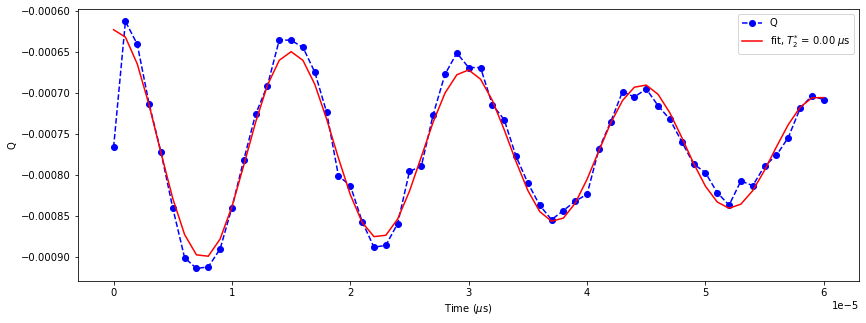

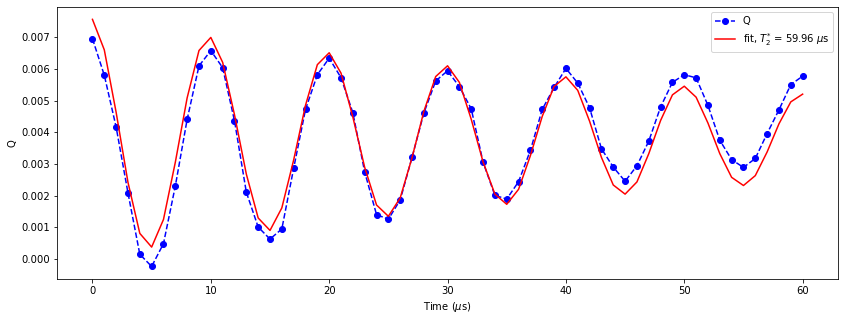

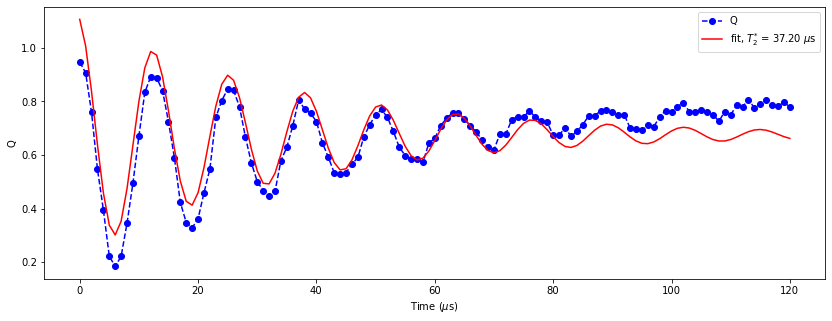

In [184]:
expt_name = 'ef_Ramsey_phase'
filelist = [1, 6, 8]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['qubit_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

## Storage Ramsey

Original qubit frequency choice = 6.0112452222931045 GHz
Oscillation freq =  0.00852218491138078  MHz
Offset freq = 0.00147781508861922 MHz
Suggested qubit frequency choice = 6.0112467001081935 GHz
T2* = 1306.9582377546012 us
Original qubit frequency choice = 6.0112452222931045 GHz
Oscillation freq =  0.008471716649232275  MHz
Offset freq = 0.0015282833507677257 MHz
Suggested qubit frequency choice = 6.011246750576455 GHz
T2* = 1291.1667700980092 us


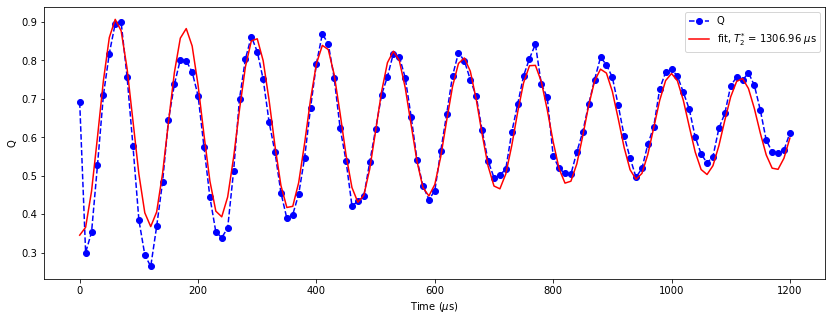

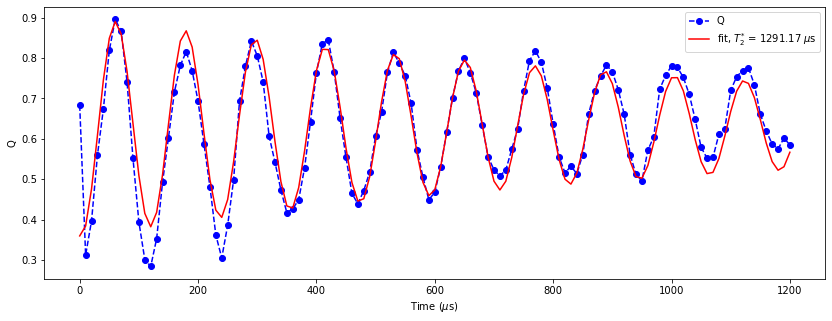

In [394]:
expt_name = 'storage_ramsey'
filelist = [4, 5]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['cavity_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

## Storage-Qubit Chi

Original qubit frequency choice = 4.746944827439069 GHz
Oscillation freq =  0.044525336497989315  MHz
Offset freq = 0.05547466350201069 MHz
Suggested qubit frequency choice = 4.747000302102571 GHz
T2* = 101.88857819972941 us


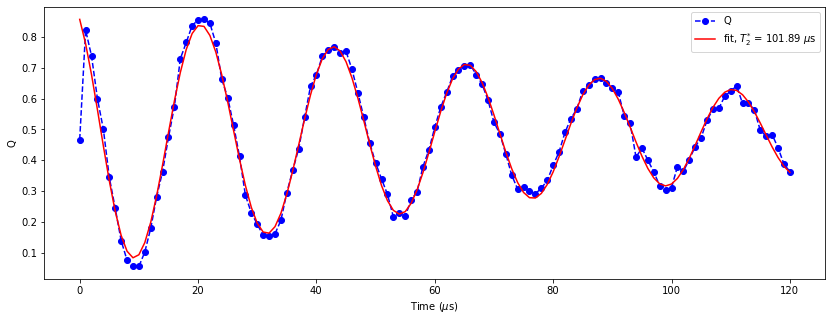

In [163]:
expt_name = 'storage_qubit_chi_ramsey'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['qubit_freq'])/1e9
        two_chi = array(a['two_chi'])/1e6
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

In [165]:
-offset + two_chi

-1.2004746635020107

# Qubit Temperature

C:\_Lib\python\slab\dsfit.py:236: RuntimeWarning: overflow encountered in power
  decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] * np.pi / 180.) * np.e ** (


[-0.47550711  1.56317374 84.8537249   2.58923997  0.56199374]
[-3.16199745e-03  4.91776093e+00 -1.09428487e+02  3.21663212e+04
  9.52690706e-01]
ge contrast ratio =  0.006649737452620583
Qubit Temp: 41.168978423939485  mK
Qubit Excited State Occupation: 0.006605810546822456
[-0.40522541  3.11357258 91.51730403 10.13070002  0.59931529]
[-2.49015167e-03  4.44422941e+01  1.01197510e+02  3.09183015e+01
  9.51975503e-01]
ge contrast ratio =  0.00614510248730303
Qubit Temp: 40.530904499368226  mK
Qubit Excited State Occupation: 0.006107570838551666


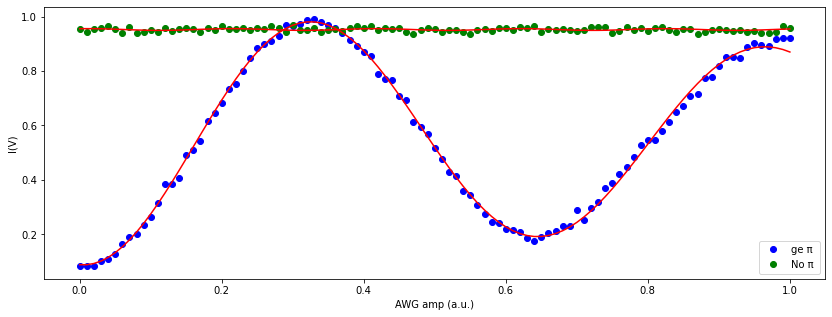

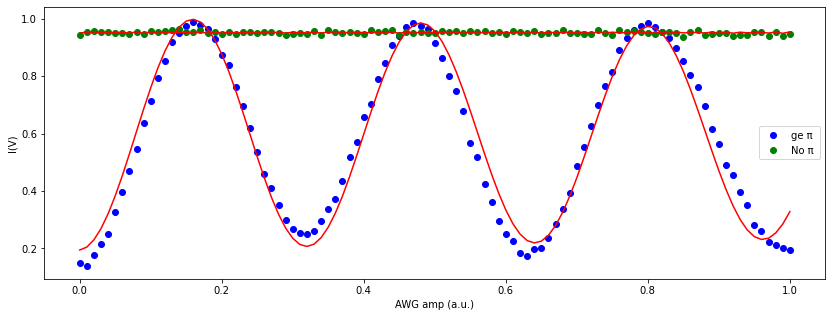

In [199]:
expt_name = 'qubit_temp'
filelist = [12, 15]

#12 - with active reset
#13- without active reset

def temperature_q(nu, rat):
    Kb = 1.38e-23
    h = 6e-34
    return h*nu/(Kb*log(1/rat))

def occupation_q(nu,T):
    Kb = 1.38e-23
    h = 6e-34
    T = T*1e-3
    return 1/(exp(h*nu/(Kb*T))+1)

q_pop = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        Ie = array(a['Ie'])
        Qe = array(a['Qe'])
        Ig = array(a['Ig'])
        Qg = array(a['Qg'])

        x = array(a['amps'])
        
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(14,5))
        axs.plot(x, Qg,'bo',label = 'ge π ')
        axs.plot(x, Qe,'go',label = 'No π ')        
        axs.set_xlabel('AWG amp (a.u.)')
        axs.set_ylabel('I(V)')
        axs.legend()
        pg = fitdecaysin(x, Qg, showfit=False)
        print(pg)
        axs.plot(x, decaysin(np.append(pg, 0), x), 'r')
        pe = fitdecaysin(x, Qe, showfit=False)
        print(pe)
        axs.plot(x, decaysin(np.append(pe, 0), x), 'r')
        
        contrast_g = pg[0]
        contrast_e = pe[0]
#         axs.set_ylim(0.8, 1.05)
    nu_q = 4.7469105
    ratio = abs(contrast_e/contrast_g)
    print ("ge contrast ratio = ", ratio)
    print ("Qubit Temp:" , 1e3*temperature_q(nu_q*1e9,ratio)," mK" )
    print ("Qubit Excited State Occupation:" , occupation_q(nu_q, 1e3*temperature_q(nu_q,ratio)))
    q_pop.append(occupation_q(nu_q, 1e3*temperature_q(nu_q, ratio)))

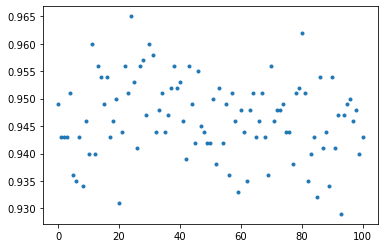

In [193]:
plt.plot(Qe, '.')

# Histogram

## Square

<ipython-input-2-832f6fe2ce20>:203: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Optimal fidelity after rotation = 0.746
Optimal fidelity after rotation = 0.701
Optimal fidelity after rotation = 0.682
Optimal fidelity after rotation = 0.904


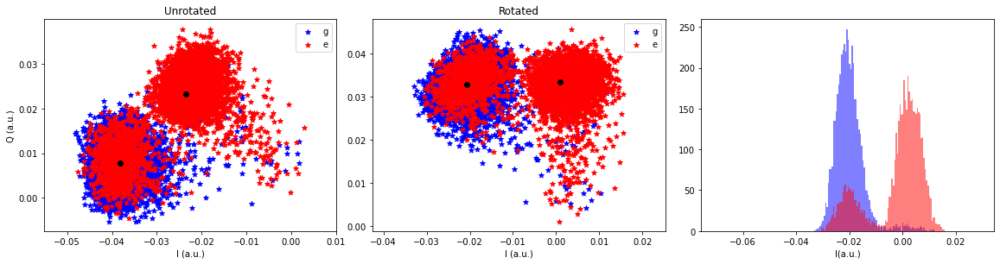

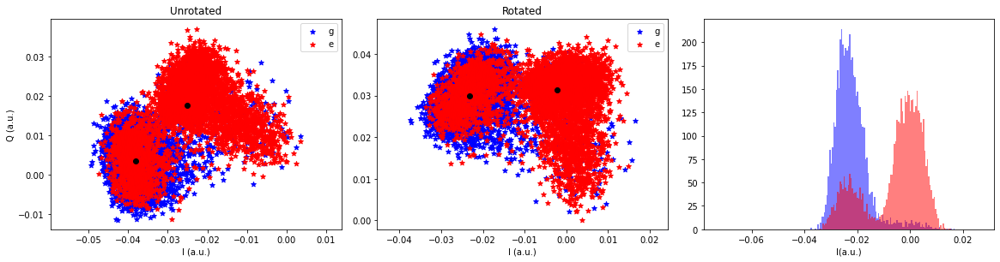

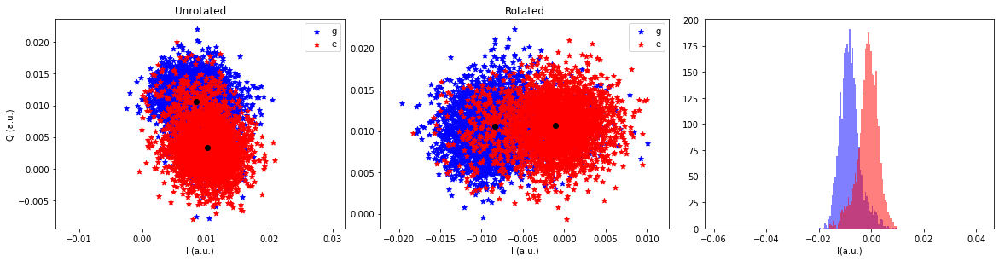

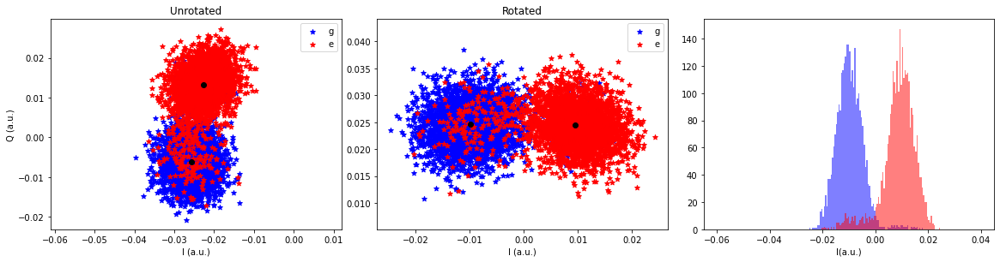

In [183]:
expt_name = 'histogram'
filelist = [35,  160, 165, 171]

for ii, i in enumerate(filelist[::-1]):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    fid, angle = hist(filename, data=None,  plot=True, ran=0.05)
    print('Optimal fidelity after rotation = %.3f'%fid)

### Amp sweep

(55000,)


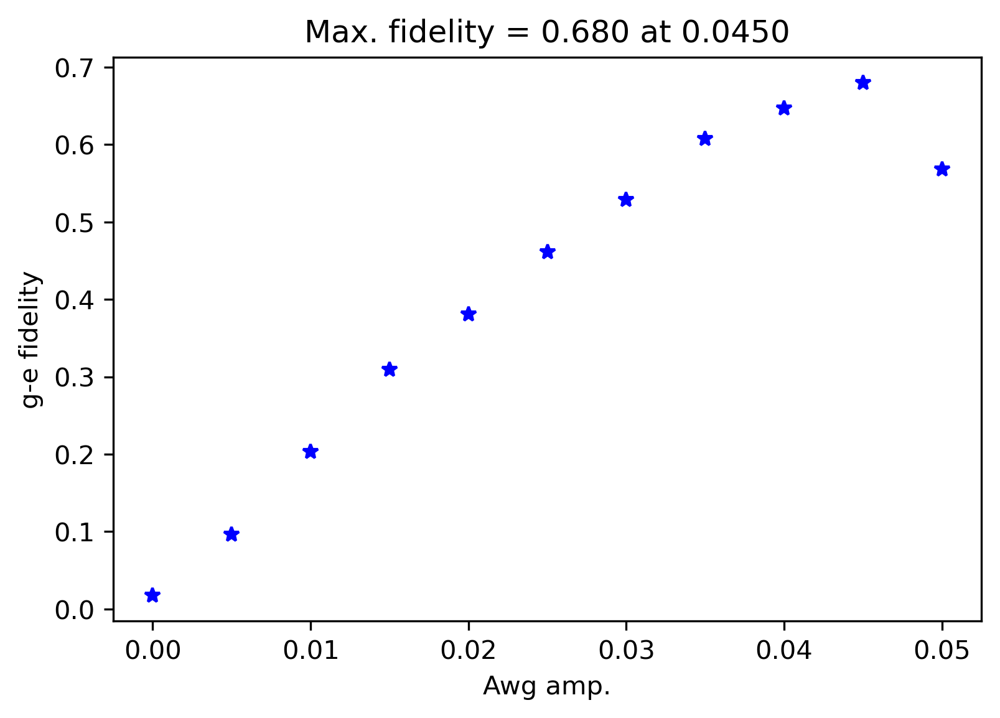

In [185]:
expt_name = 'histogram_amp_sweep'
filelist = [23]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.045 0.6796


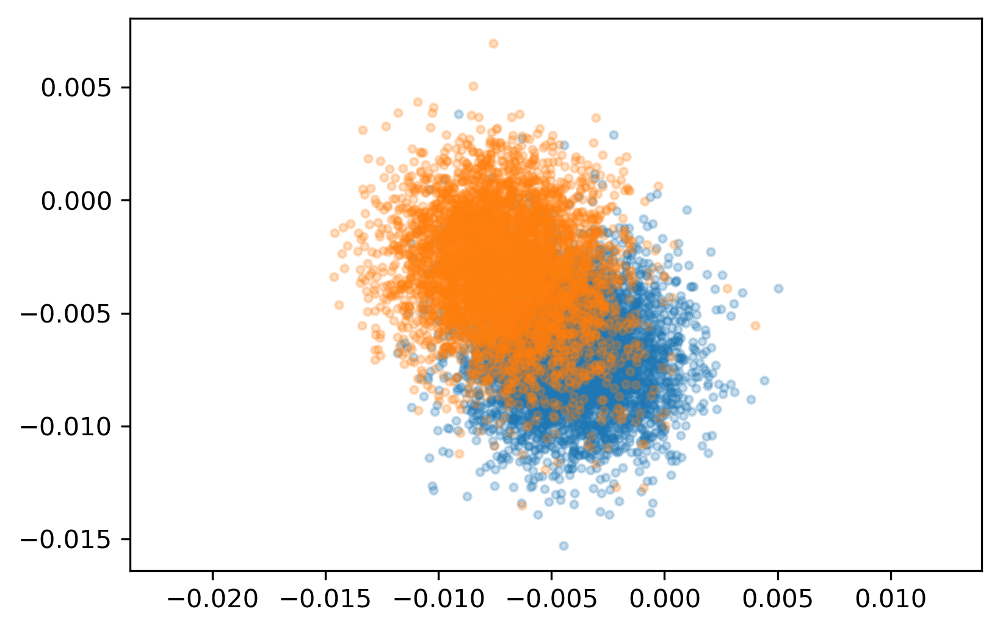

In [186]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### Freq sweep

(105000,)


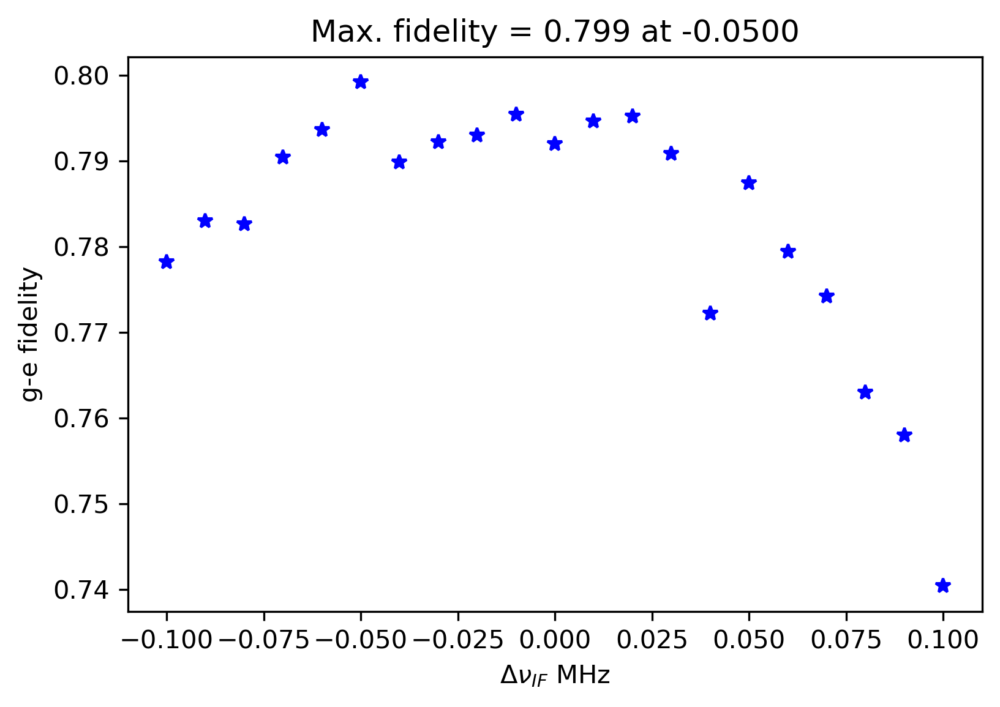

0.7992


In [187]:
expt_name = 'histogram_freq_sweep'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        freq = array(a['freq'])/1e6
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(freq)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
        fid_f_p.append(fid)

plt.figure(dpi=300)
plt.plot(freq, fid_f_p, 'b*')
plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), freq[np.argmax(fid_f_p)]))
plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
plt.ylabel('g-e fidelity')
plt.show()
print(max(fid_f_p))

### JPA amp sweep

(105000,)


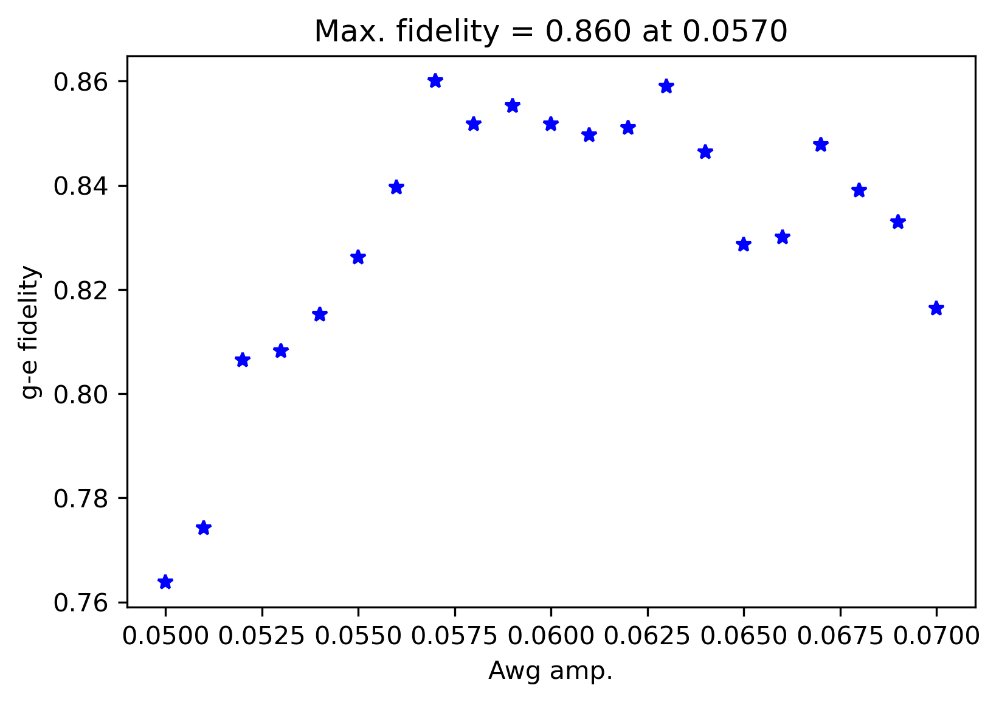

In [202]:
expt_name = 'histogram_jpa_amp_sweep'
filelist = [15]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.05 0.7638


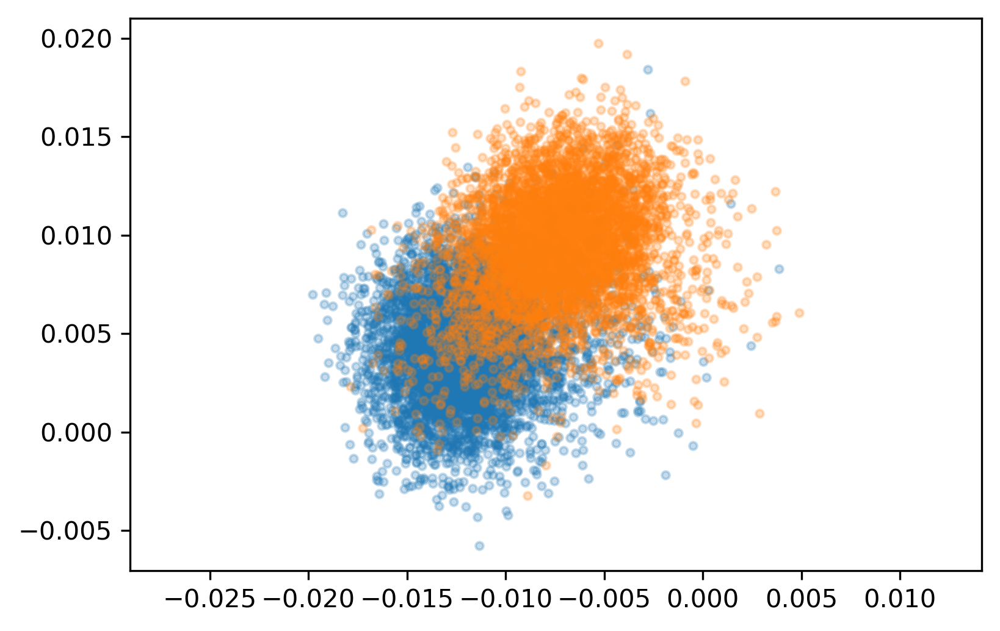

In [203]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA freq sweep

(105000,)


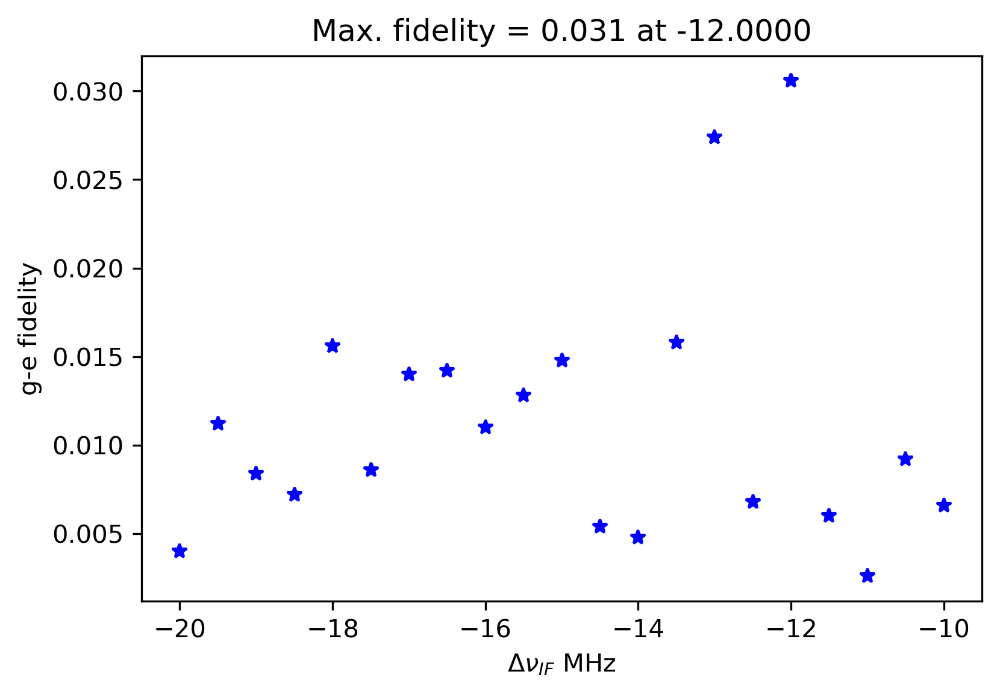

0.0306


In [211]:
expt_name = 'histogram_jpa_freq_sweep'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        freq = array(a['freq'])/1e6
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(freq)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.3)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(freq, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), freq[np.argmax(fid_f_p)]))
    plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
    plt.ylabel('g-e fidelity')
    plt.show()
    print(max(fid_f_p))

In [ ]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA with rr amp sweep

(105000,)


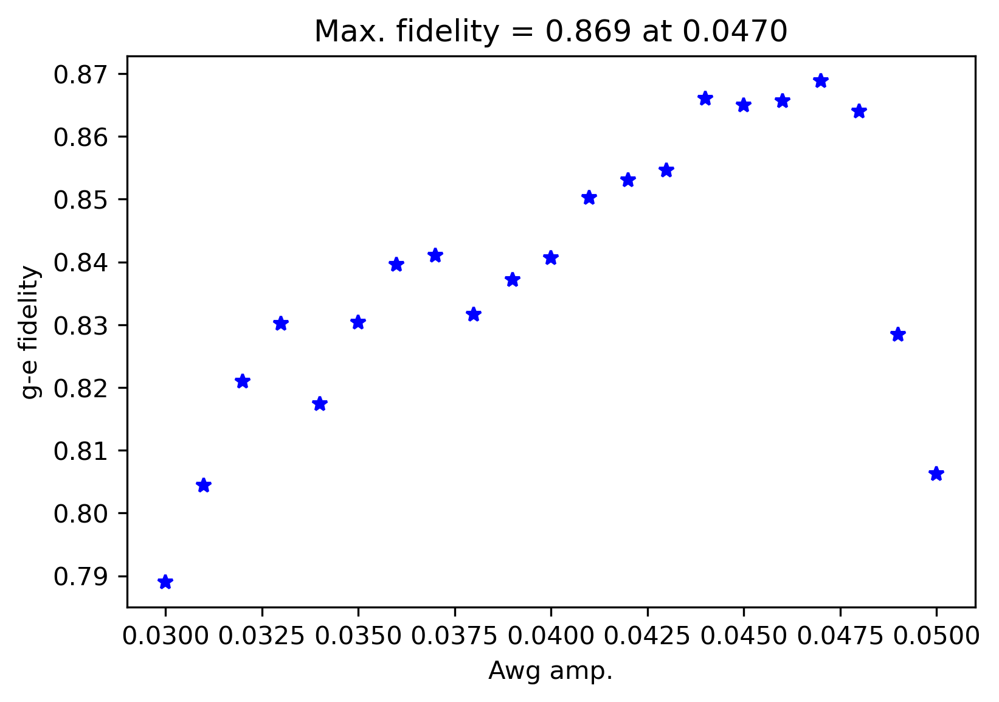

In [200]:
expt_name = 'histogram_amp_jpa_sweep'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.03 0.789


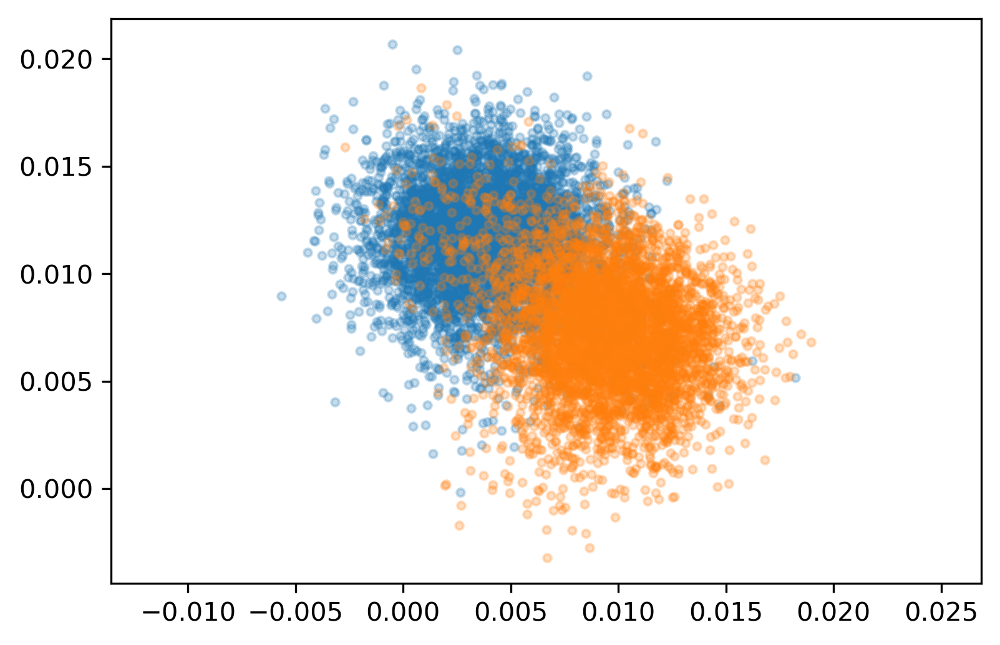

In [201]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### rr amp and jpa amp sweep

(275000,)
25 0.7752


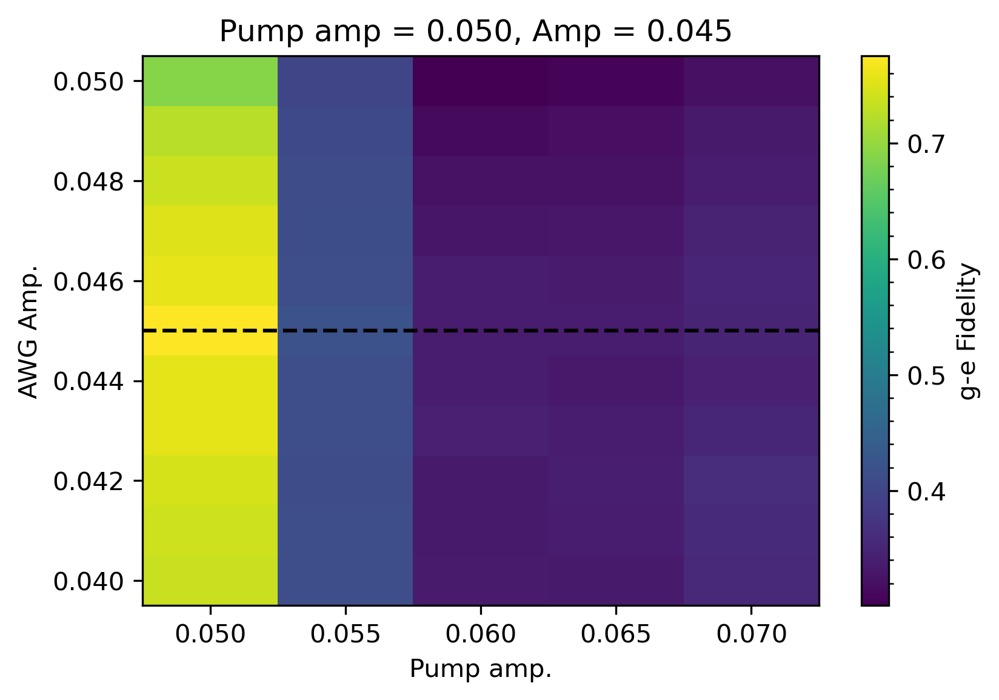

In [197]:
expt_name = 'histogram_jpa_rr_amp_sweep'
filelist = [2]
#1- 3us long
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        pamp = array(a['pamp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        ig, qg = Ig.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs], Qg.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs]
        ie, qe = Ie.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs], Qe.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs]
        fid_freq = []
        """For the same readout power, compute the g|e fidelity corresponding to each readout frequency"""
        for jj in range(len(pamp)):
            a = ig.iloc[jj:(jj+1)*avgs]
            b = qg.iloc[jj:(jj+1)*avgs]
            c = ie.iloc[jj:(jj+1)*avgs]
            d = qe.iloc[jj:(jj+1)*avgs]
            data = [a, b, c, d]
            fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
            fid_freq.append(fid)
        fid_f_p.append(fid_freq)
        
        
    ind = np.argmax(fid_f_p)
    fid_max = np.max(fid_f_p)
    print(ind, fid_max)

    plt.figure(dpi=300)
    plt.pcolormesh(pamp, amp, fid_f_p, shading='auto')
    cbar = plt.colorbar()
    cbar.minorticks_on()
    cbar.set_label('g-e Fidelity')
    plt.title(r'Pump amp = %.3f, Amp = %.3f '%(pamp[ind%len(pamp)], amp[ind//len(pamp)]))
    plt.xlabel(r'Pump amp.')
    plt.ylabel('AWG Amp.')
#     plt.axvline(x = pamp[ind%len(pamp)]/1e6, linestyle='--', color='k')
    plt.axhline(y = amp[ind//len(pamp)], linestyle='--', color='k')
    plt.show()

### Freq and amp sweep

In [ ]:
expt_name = 'histogram_freq_amp_sweep'
filelist = [13]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        attens = array(a['amp'])
        freqs = array(a['freq'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(attens)):
        """Select all the rows corresponding to the same readout power"""
        ig, qg = Ig.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs], Qg.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs]
        ie, qe = Ie.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs], Qe.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs]
        fid_freq = []
        """For the same readout power, compute the g|e fidelity corresponding to each readout frequency"""
        for jj in range(len(freqs)):
            a = ig.iloc[jj:(jj+1)*avgs]
            b = qg.iloc[jj:(jj+1)*avgs]
            c = ie.iloc[jj:(jj+1)*avgs]
            d = qe.iloc[jj:(jj+1)*avgs]
            data = [a, b, c, d]
            fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
            fid_freq.append(fid)
        fid_f_p.append(fid_freq)
        
    ind = np.argmax(fid_f_p)
    fid_max = np.max(fid_f_p)
    print(ind, fid_max)

    plt.figure(dpi=300)
    plt.pcolormesh(freqs/1e6, attens, fid_f_p, shading='auto')
    cbar = plt.colorbar()
    cbar.minorticks_on()
    cbar.set_label('g-e Fidelity')
    plt.title(r'$\nu$ = %.3f MHz, Amp = %.3f '%(freqs[ind%len(freqs)]/1e6, attens[ind//len(freqs)]))
    plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
    plt.ylabel('AWG Amp.')
    plt.axvline(x = freqs[ind%len(freqs)]/1e6, linestyle='--', color='k')
    plt.axhline(y = attens[ind//len(freqs)], linestyle='--', color='k')
    plt.show()

In [ ]:
plt.plot(np.array(a), np.array(b), '.')
plt.plot(np.array(c), np.array(d), '.')

## Optimal

###  Amp sweep

(80000,)


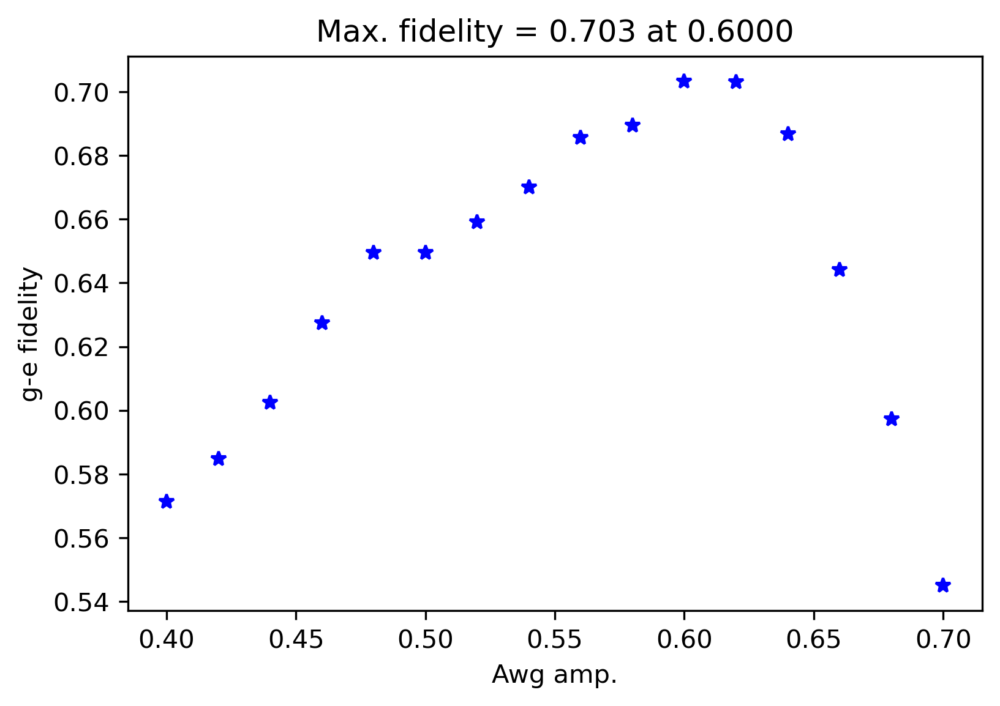

In [219]:
expt_name = 'histogram_clear_amp_sweep'
filelist = [13]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.6000000000000002 0.7032


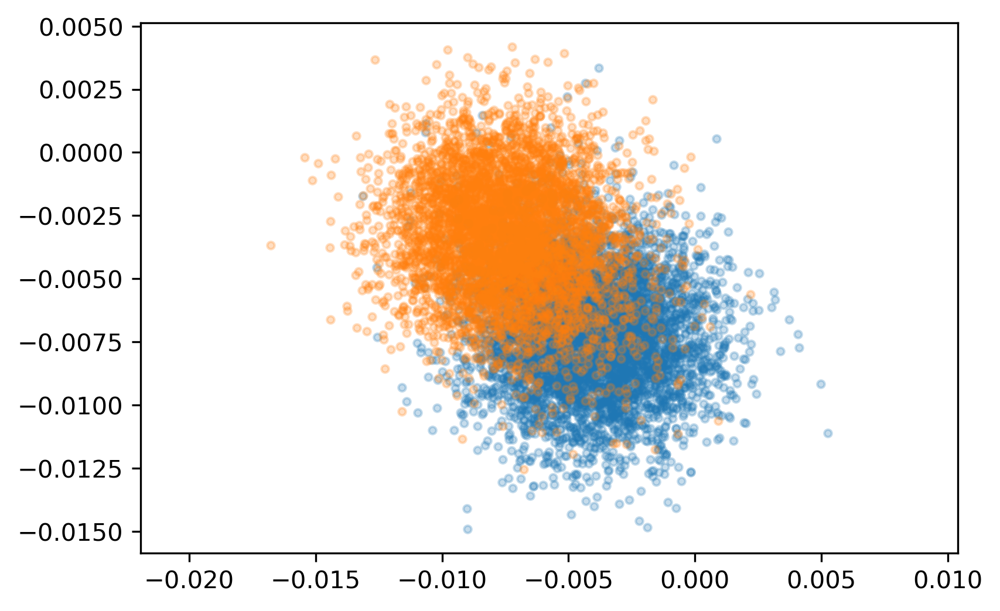

In [220]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA Amp sweep

(105000,)


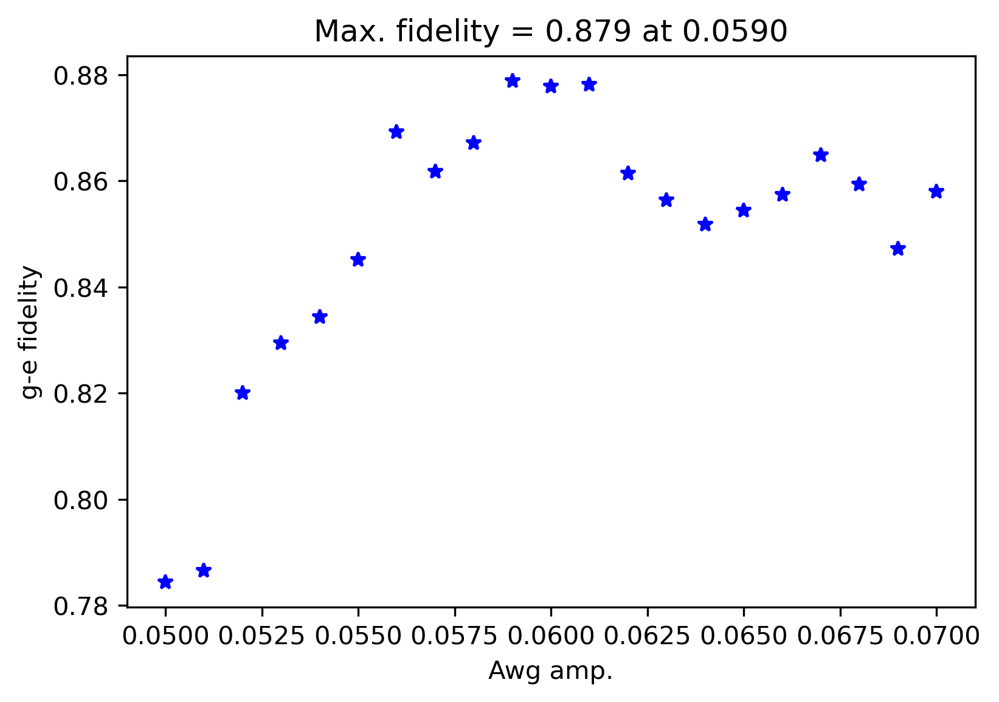

In [214]:
expt_name = 'histogram_clear_jpa_amp_sweep'
filelist = [0]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.05 0.7844


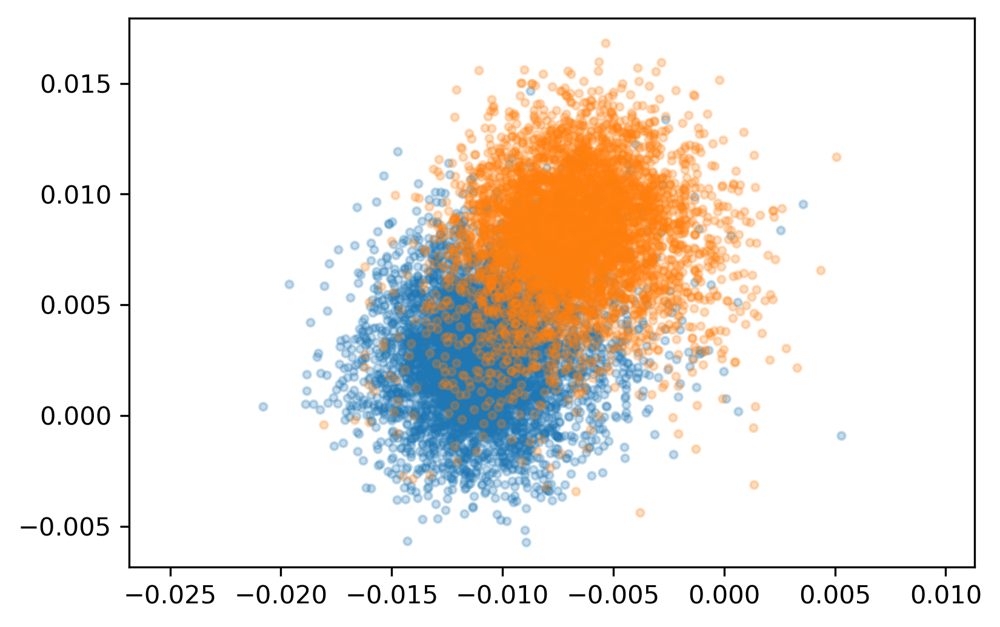

In [215]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

## Optimal weight

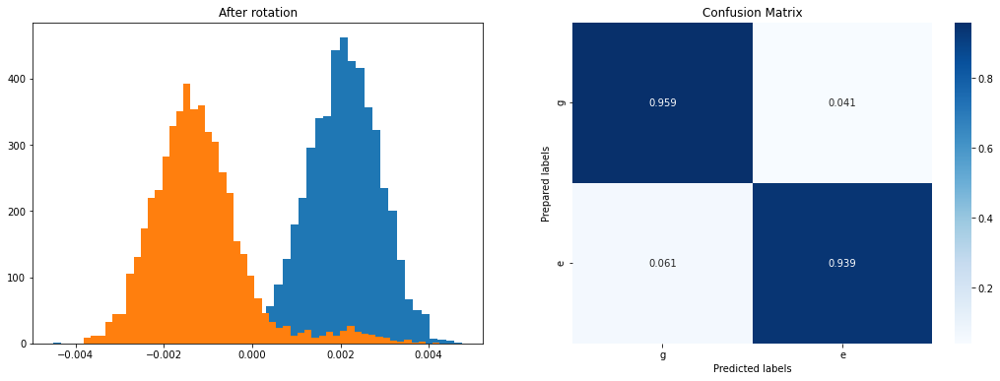

In [237]:
expt_name = 'histogram_disc'
filelist = [120]
import seaborn as sns

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        I = array(a['I'])
        Q = array(a['Q'])
        res = array(a['res'])
        avgs = array(a['avgs'])
        seq0 = array(a['seq0'])
        a.close()
        
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
axs[0].hist(I[np.array(seq0) == 0], 50)
axs[0].hist(I[np.array(seq0) == 1], 50)
axs[0].set_title('After rotation')

p_s = np.zeros(shape=(2, 2))
for i in range(2):
    res_i = res[np.array(seq0) == i]
    p_s[i, :] = np.array([np.mean(res_i == 0), np.mean(res_i == 1)])

labels = ['g', 'e']
ax = axs[1]
sns.heatmap(p_s, annot=True, ax=ax, fmt='g', cmap='Blues')

ax.set_xlabel('Predicted labels')
ax.set_ylabel('Prepared labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

plt.show()

infidelity = 1- 0.5*(np.sum(np.diag(p_s)))

### Optimal amp sweep

In [236]:
expt_name = 'histogram_disc_amp_sweep'
filelist = [0]
import seaborn as sns

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        I = array(a['I'])
        Q = array(a['Q'])
        res = array(a['res'])
        avgs = array(a['avgs'])
        seq0 = array(a['seq0'])
        a.close()
        
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
axs[0].hist(I[np.array(seq0) == 0], 50)
axs[0].hist(I[np.array(seq0) == 1], 50)
axs[0].set_title('After rotation')

p_s = np.zeros(shape=(2, 2))
for i in range(2):
    res_i = res[np.array(seq0) == i]
    p_s[i, :] = np.array([np.mean(res_i == 0), np.mean(res_i == 1)])

labels = ['g', 'e']
ax = axs[1]
sns.heatmap(p_s, annot=True, ax=ax, fmt='g', cmap='Blues')

ax.set_xlabel('Predicted labels')
ax.set_ylabel('Prepared labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

plt.show()

infidelity = 1- 0.5*(np.sum(np.diag(p_s)))

0.05120000000000002

# Storage

## Spectroscopy

fits =  [ 1.02358240e-04  1.14023923e-05 -1.60501338e+03  2.30425122e+03]
fits =  [1.05884387e-04 4.32841192e-05 6.58967475e+01 4.60260913e+01]


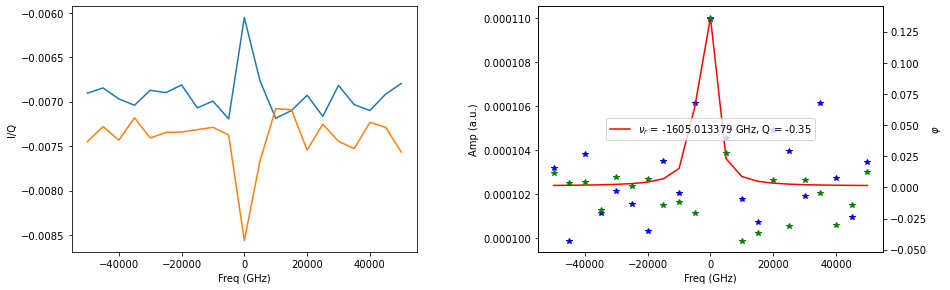

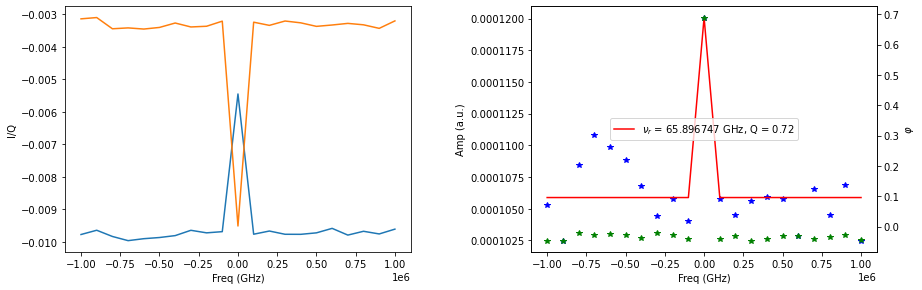

In [23]:
expt_name = 'storage_spec'
filelist = [0, 6]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

## Number splitting

0.75 400


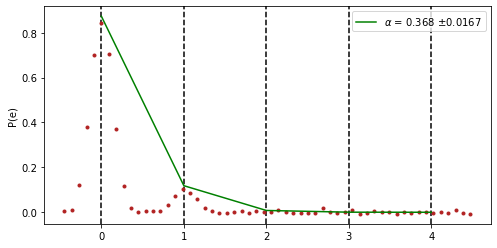

0.5 800


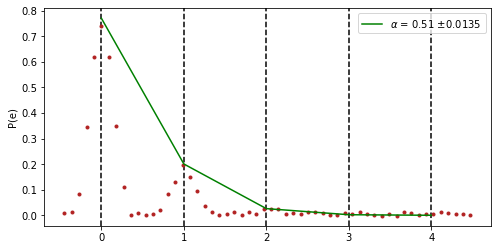

0.4 1200


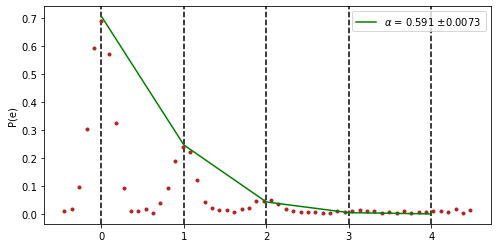

In [79]:
expt_name = 'number_splitting'
filelist = [17, 18, 19]

qubit_freq = 4.746910599438208
two_chi = -1.118e6
N = 5
contrast = [0.9525, 0.013]


two_chi_meas = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
        print(cav_amp, cav_len)
        x = freqs
        """Scaling the probability values with g and e"""
        y = (Q - contrast[1])/contrast[0]
        
        plt.figure(figsize=(8, 4))

        for j in range(N):
            plt.axvline(x=j, linestyle='--', color='k')
        plt.plot(x, y, '.', color='firebrick') 
        
        fitparams = np.zeros(3*N+1)
        fitparams[0] = 0

        for kk in range(N):
            fitparams[3*kk+1] = max(y)
            fitparams[3*kk+2] = kk
            fitparams[3*kk+3] = 0.3

        p1, p2 = fitgausssum_with_baseline(x, y, fitparams=fitparams)
        
#         plt.plot(gaussfuncsum_with_baseline(x[::-1], *p1))                   
        peak_val, freq_val = fitamp(p1)
        
        two_chi_meas.append(-two_chi*(p1[5]-p1[2])/1e6)
        
        a, a_err = fitcoherentstate(peak_val)
        plt.plot(coherent_state(np.arange(len(peak_val)), a), 'g', label=r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
        
        plt.ylabel('P(e)')
        plt.legend(loc='best')
        plt.show()


In [81]:
np.mean(two_chi_meas)

1.1192930148277964

In [72]:
-two_chi*(p1[5] - p1[2])/1e6

1.1115255233952739

### Correction to cross-Kerr

0.4 400


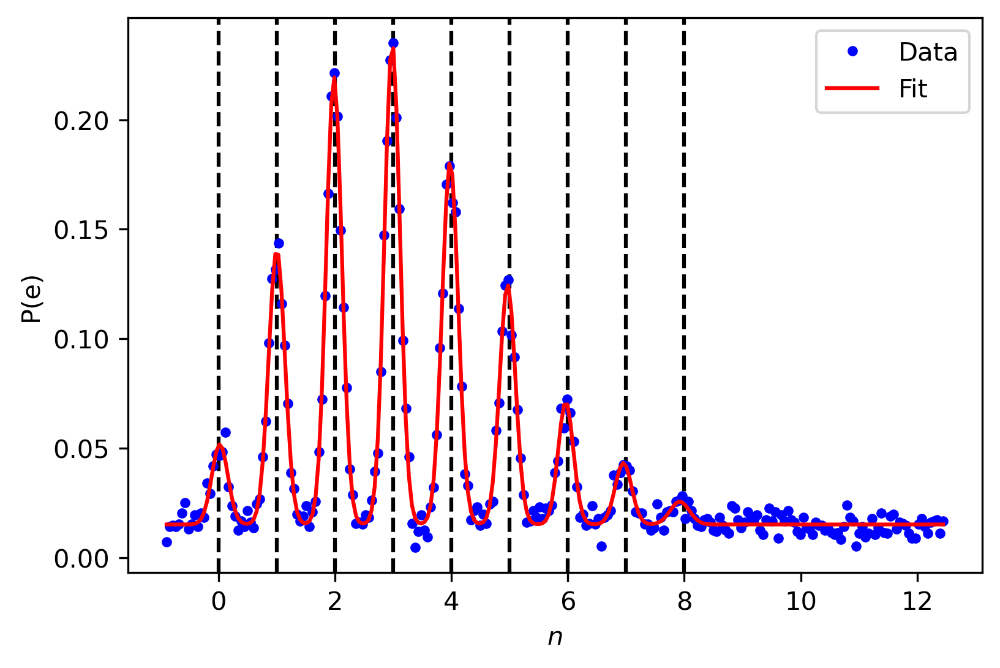

In [277]:
expt_name = 'number_splitting'
filelist = [25]

def chi_to_n(n, chi, chi_prime):
    return n*chi + (n**2) * chi_prime/2

N = 9
contrast = [0.953, 0.0165]
# two_chi = -1.119*1e6
two_chi_meas = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        two_chi = np.array(a['two_chi'])
        freqs = (np.array(a['freq']))[:]/two_chi
        a.close()
        print(cav_amp, cav_len)
        x = freqs
        """Scaling the probability values with g and e"""
        y = (Q - contrast[1])/contrast[0]
        
plt.figure(dpi=300)

for j in range(N):
    plt.axvline(x=j, linestyle='--', color='k')
plt.plot(x, y, '.', color='b', label='Data') 

fitparams = np.zeros(3*N+1)
fitparams[0] = 0

for kk in range(N):
    fitparams[3*kk+1] = max(y)
    fitparams[3*kk+2] = kk
    fitparams[3*kk+3] = 0.3

p1, p2 = fitgausssum_with_baseline(x, y, fitparams=fitparams)

plt.plot(x[::-1], gaussfuncsum_with_baseline(x[::-1], *p1), 'r', label='Fit')                   
peak_val, freq_val = fitamp(p1)
plt.ylabel('P(e)')
plt.xlabel('$n$')
plt.legend(loc='best')
plt.show()

In [278]:
np.sqrt(np.diag(p2)[::3])

array([0.00042684, 0.01218049, 0.00356086, 0.00214146, 0.00198421,
       0.00267993, 0.00401598, 0.00773043, 0.01602866, 0.04650199])

In [279]:
freq_val

[0.025914627762772525,
 1.003581721051034,
 1.9864069950831622,
 2.98565527731203,
 3.980298339465335,
 4.965277454645251,
 5.965243427990799,
 6.954155626512183,
 7.922342904496223]

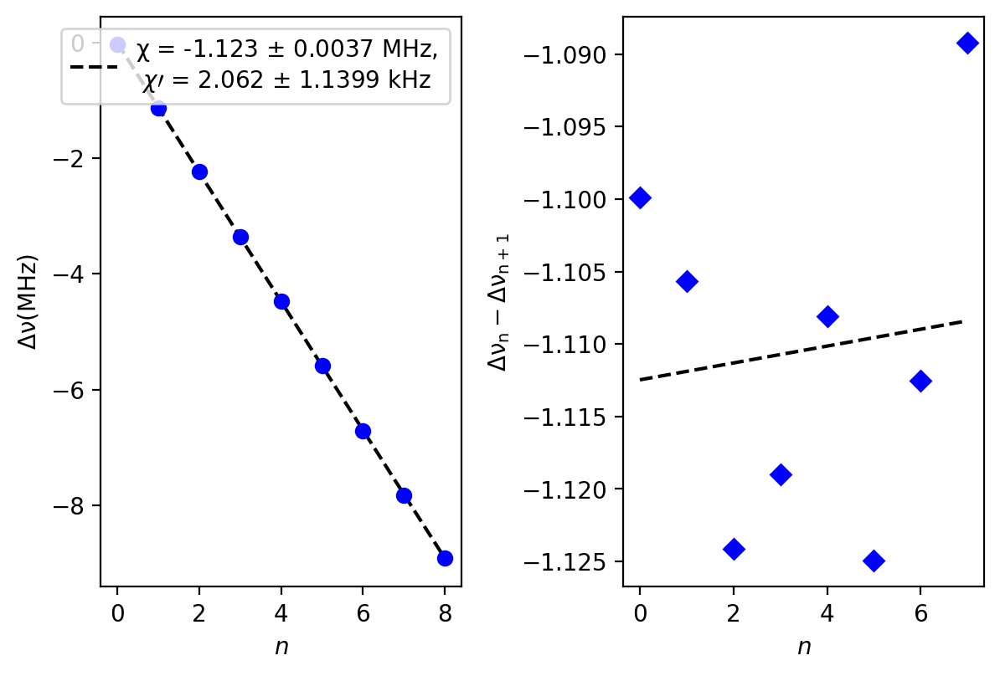

In [286]:
x = np.arange(len(freq_val))
y = np.array(freq_val)*two_chi/1e6
y_err = np.sqrt(np.diag(p2)[::3])[1:]*two_chi/1e6

fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200)
fig.tight_layout()
plt.subplots_adjust(wspace = 0.45)
axs[0].errorbar(x, y, yerr=y_err, fmt='o', capthick=4, markerfacecolor='b', markeredgecolor='b', ecolor='r')
axs[0].set_ylabel(r'$\mathrm{\Delta \nu (MHz)}$')
popt, pcov = curve_fit(f=chi_to_n, xdata=x , ydata=y)
axs[0].plot(x, chi_to_n(x, *popt), 'k--', label='χ = {:.3f} $\pm$ {:.4f} MHz, \n $\chi \prime$ = {:.3f} $\pm$ {:.4f} kHz'.format(popt[0], np.sqrt(np.diag(pcov)[0]),  1e3*popt[1], 1e3*np.sqrt(np.diag(pcov)[1])))
axs[0].set_xlabel('$n$')
axs[0].legend(loc='best')

diff = np.ediff1d(y)
coef = np.polyfit(x[:-1], diff, 1)
poly1d_fn = np.poly1d(coef) 
# poly1d_fn is now a function which takes in x and returns an estimate for y

plt.plot(x[:-1], poly1d_fn(x[:-1]), '--k')
axs[1].plot(x[:-1], diff , 'bD')
axs[1].set_ylabel(r'$\mathrm{\Delta \nu_{n} - \Delta \nu_{n+1}}$')
axs[1].set_xlabel('$n$')
plt.show()

In [287]:
popt

array([-1.12344368,  0.00206172])

## SNAP Fock prep

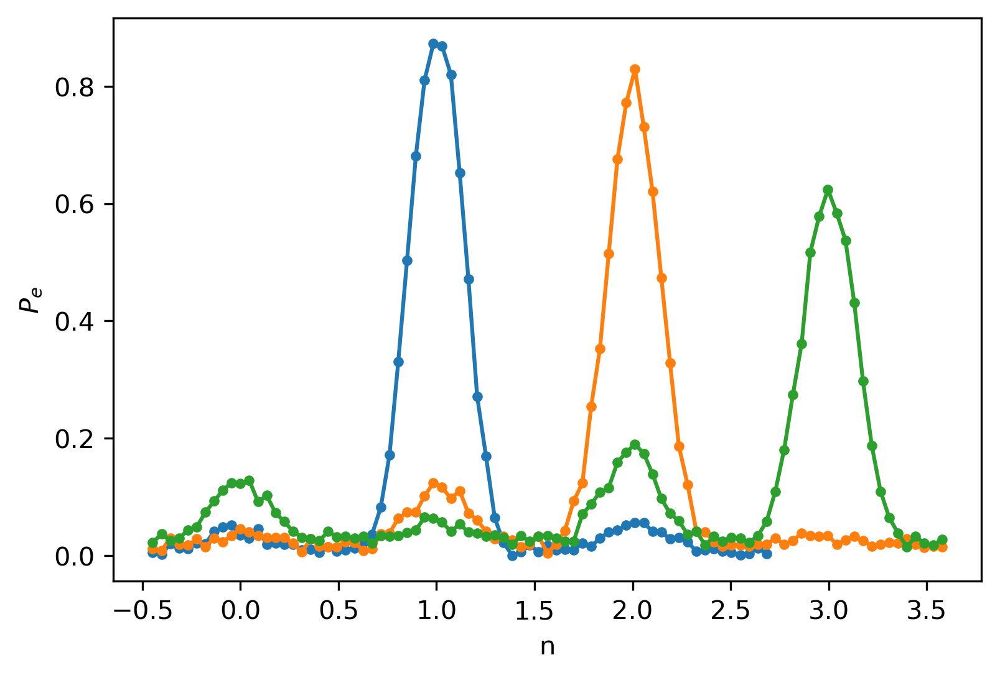

In [213]:
expt_name = 'snap_fock_prep'
filelist = [2, 3, 5]
two_chi = -1.118e6
cal = [0.949, 0.011]
plt.figure(dpi=300)
# [0 1 2 3] [ 1158 12054   775  1013]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
        
        Q = (Q-cal[1])/cal[0]
        
        plt.plot(freqs, Q, '.-')

plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.show()

0.86
0.797


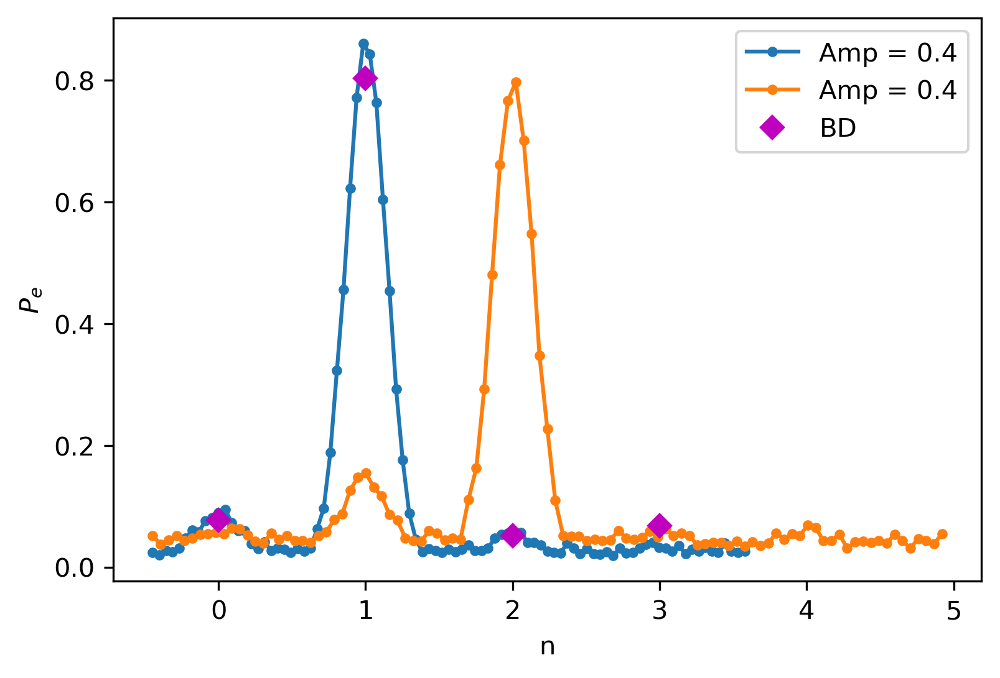

In [215]:
expt_name = 'snap_fock_prep'
filelist = [19, 23]
two_chi = -1.118e6
cal = [0.9205, 0.002]
# 0.9205 0.002
plt.figure(dpi=300)
amp = [0.4, 0.4]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    plt.plot(freqs, Q, '.-', label='Amp = {}'.format(amp[ii]))
    print(np.max(Q))

plt.plot([0 ,1, 2, 3],np.array([ 1158, 12054,   775,  1013])/15000, 'Dm', label='BD')
plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

In [239]:
np.exp(-3/100) * np.exp(-3/100)

0.9417645335842487

## Comparison of SNAP and OCT

0.9321021184139054
0.8180336773492667
0.9429657794676806
0.8766974470396525


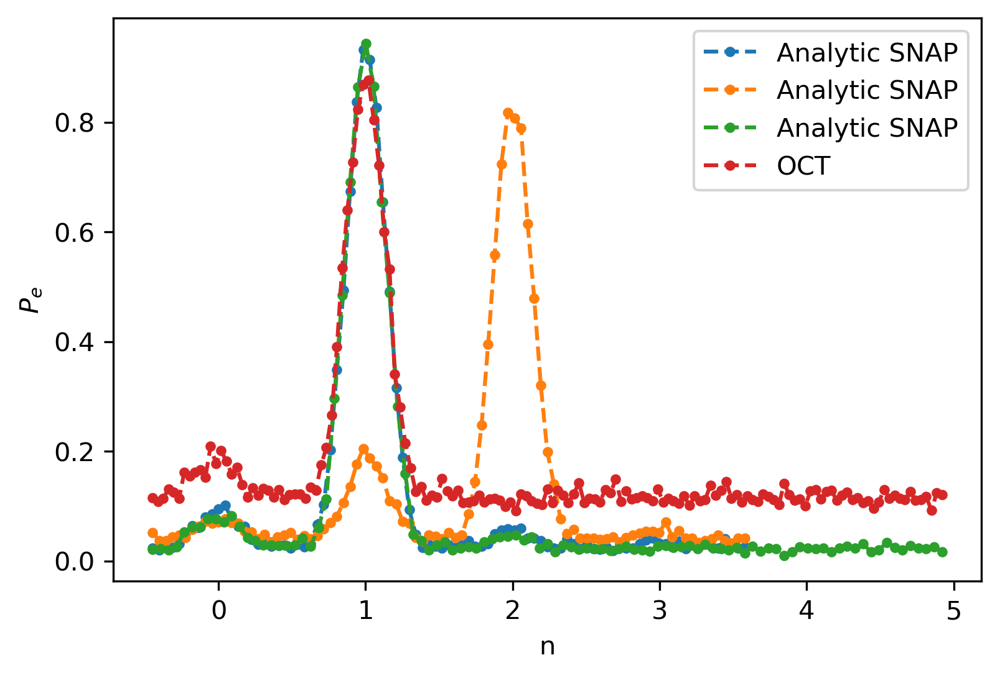

In [28]:
expt_name = 'snap_fock_prep'
filelist = [19, 20, 21]
two_chi = -1.118e6
cal = [0.9205, 0.002]
# 0.9205 0.002
plt.figure(dpi=300)
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    Q = (Q-cal[1])/cal[0]
    plt.plot(freqs, Q, '.--', label='Analytic SNAP')
    print(np.max(Q))

expt_name = 'oct_fock'
filelist = [4]
two_chi = -1.118e6
cal = [0.9205, 0.002]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    Q = (Q-cal[1])/cal[0]
    plt.plot(freqs, Q, '.--', label='OCT')
    print(np.max(Q))    
    
plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

## Wigner Tomography

No handles with labels found to put in legend.


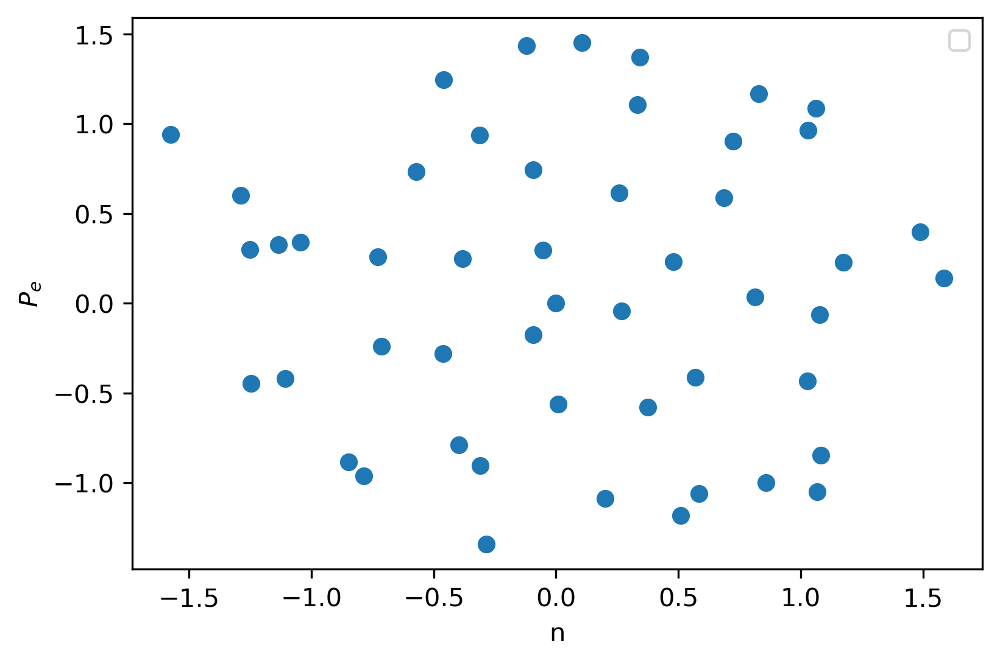

In [215]:
expt_name = 'wigner_tomo_binary_decomp'
filelist = [7]
two_chi = -1.118e6
cal = [0.9575, 0.019]
plt.figure(dpi=300)
# amp = [0.4, 0.35, 0.45]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        Q = np.array(a['res'])[:]
        alpha_x = np.array(a['alphax'])[:]
        alpha_y = np.array(a['alphay'])[:]
        a.close()
        
    Q = (Q-cal[1])/cal[0]
        
#         plt.plot(freqs, Q, '.-', label='Amp = {}'.format(amp[ii]))
plt.xlabel('n')
plt.scatter(alpha_x, alpha_y)
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

In [216]:
from scipy.linalg import expm

import matplotlib .pyplot as plt
import matplotlib .patches as mpatches
import numpy as np
from scipy.special import genlaguerre
from math import sqrt,factorial
from numpy.linalg import cond,svd
from scipy.optimize import fmin,check_grad,minimize
from IPython.display import display,clear_output
import time

Nmax = 100 # for numerical definition of displacement operator before exponentiation

class gen_wigner_tomography_analysis:
    
    def __init__(self,alphas,mode_state_num = 5,theta = pi,analytic=False):       
        self.alphas = alphas
        self.m = mode_state_num
        self.I  = (np.diag((1+0j)*ones(self.m), 0))
        self.Par =  (np.diag(np.exp(1j*pi*(np.arange(0, self.m))), 0))
        self.analytic = analytic
        self.theta = theta

    def Phase_op(self,theta):
        return ((np.diag(cos(theta*(np.arange(0, self.m))), 0)))
    
    def D(self,beta):
        M_m = np.diag(np.sqrt(np.arange(1, 100)), 1)
        M_p = np.diag(np.sqrt(np.arange(1, 100)), -1)
        return (expm(beta*M_p - conj(beta)*M_m))[:self.m,:self.m]

    def W_op(self,alpha):
        analytic = self.analytic
        if analytic:
            w = np.zeros((self.m,self.m),dtype=complex)
            B = 4*abs(alpha)**2
            pf = (2/np.pi)*np.exp(-B/2.0)
            for m in range(self.m):
                x = pf*real((-1)**m*genlaguerre(m, 0)(B))
                # x = pf*((-1)**m*genlaguerre(m, 0)(B))
                w[m, m] = x
                for n in range(m+1, self.m):
                    pf_nm = sqrt(factorial(m)/float(factorial(n)))
                    x = pf * pf_nm * (-1)**m * 2 * (2*alpha)**(n-m-1)*genlaguerre(m, n-m)(B)
                    if m > 0:
                        y = 8 * pf * pf_nm * (-1)**(m-1)*(2*alpha)**(n-m) *genlaguerre (m-1,n-m+1)(B)
                    w[m, n] = alpha * x
                    w[n, m] = (alpha * x). conj ()          
        else:  w  = 2/pi*dot(self.D(alpha),dot(self.Par,self.D(-alpha)))      
        return w
        
    def gen_W_op(self,theta,alpha):
        w  = 2/pi*dot(self.D(alpha),dot(self.Phase_op(theta),self.D(-alpha)))      
        return w
    
    def wigner_mat_and_grad(self,disps,FD,reshape=True):
        ND = len(disps)
        wig_tens = np.zeros((ND,FD,FD),dtype=complex)
        grad_mat_r = np.zeros((ND,FD,FD),dtype=complex)
        grad_mat_i = np.zeros((ND,FD,FD),dtype=complex)

        B = 4*abs(disps)**2
        pf = (2/np.pi)*np.exp(-B/2.0)
        for m in range(FD):
            x = pf*np.real((-1)**m*genlaguerre(m, 0)(B))
            term_r = -4*disps.real*x
            term_i = -4*disps.imag*x
            if m > 0:
                y = 8*pf*(-1)**(m-1)*genlaguerre(m-1, 1)(B)
                term_r += disps.real * y
                term_i += disps.imag * y
            wig_tens[:, m, m] = x
            grad_mat_r[:, m, m] = term_r
            grad_mat_i[:, m, m] = term_i

            for n in range(m+1, FD):
                pf_nm = sqrt( factorial (m)/float( factorial (n)))
                x = pf * pf_nm * (-1)**m * 2 * (2*disps)**(n-m-1) * genlaguerre (m, n-m)(B)
                term_r = ((n - m) - 4*disps.real*disps)*x
                term_i = (1j * (n - m) - 4*disps.imag*disps) * x
                if m > 0:
                    y = 8 * pf * pf_nm * (-1)**(m-1)*(2*disps)**(n-m) *genlaguerre (m-1, n-m+1)(B)
                    term_r += disps.real * y
                    term_i += disps.imag * y

                wig_tens [:, n, m] = disps * x
                wig_tens [:, m, n] = (disps * x). conj ()
                grad_mat_r [:, n, m] = term_r
                grad_mat_r [:, m,n] = term_r . conjugate ()
                grad_mat_i [:, n,m] = term_i
                grad_mat_i [:, m,n] = term_i . conjugate ()
        if reshape:return (wig_tens .reshape ((ND , FD**2)),grad_mat_r .reshape ((ND , FD**2)),grad_mat_i .reshape ((ND , FD**2)))
        else:return (wig_tens,grad_mat_r,grad_mat_i)


    def curlyM(self):
        analytic=self.analytic
        if analytic:
            if self.theta ==pi:
                curlyM, gcurlyMx, gcurlyMy = self.wigner_mat_and_grad(self.alphas,self.m,reshape=True)
            else:print("No analytic expression for arb theta")
        else:
            M_mat = array([self.gen_W_op(self.theta,alpha) for alpha in self.alphas])
            curlyM = array([transpose(m).flatten() for m in M_mat])
        return curlyM

    def curlyMinv(self):
        curlyM_inv = linalg.pinv(self.curlyM())
        
        return curlyM_inv
    
    def rho_pinv(self,w_vec):
        self.x = w_vec
        curlyM_inv = linalg.pinv(self.curlyM())
        rho_vec = dot(curlyM_inv,self.x)
        rho = rho_vec.reshape(self.m,self.m)
        return rho
    
    def rho_pinv2(self,w_vec):
        self.x = w_vec
        curlyM_inv2 = dot(pinv(dot((transpose(self.curlyM())),self.curlyM())),(transpose(self.curlyM())))
        rho_vec = dot(curlyM_inv2,self.x)
        rho = rho_vec.reshape(self.m,self.m)
        return rho
    
    
    def extracted_W(self,rho,alphaxs,alphays):
        return array([[trace(dot(self.W_op(alphax + 1j*alphay),rho)) 
                            for alphax in alphaxs] for alphay in alphays])
    
    
    def extracted_W_single(self,rho,alpha):
        return trace(dot(self.W_op(alpha),rho))

    
    def expect_gen_W(self,theta,rho,alphaxs,alphays):
        return array([[trace(dot(self.gen_W_op(theta,alphax + 1j*alphay),rho)) 
                            for alphax in alphaxs] for alphay in alphays])
    
    def expect_gen_W_single(self,theta,rho,alpha):
        return trace(dot(self.gen_W_op(theta,alpha),rho))
    
    
    def extracted_W_single_analytic(self,rho,disps,FD):
        W,gWx,gWy = self.wigner_mat_and_grad(disps,FD,reshape=False)
        
        return array([trace(dot(w,rho)) for w in W])
        
    def rho_pinv_trace_1(self,w_vec):

        rho = np.zeros((self.m,self.m),dtype=complex)
        self.x = w_vec
        i_vec = self.I.flatten()
        
        A = zeros([self.m**2+1, self.m**2+1],dtype=complex)
        A[:self.m**2,:self.m**2] = dot((transpose(self.curlyM())),self.curlyM())
        A[self.m**2,self.m**2], A[self.m**2][:self.m**2], A.T[self.m**2][:self.m**2] = 0,i_vec,i_vec
        vec_b = ones([self.m**2+1],dtype=complex)

        vec_b[:self.m**2] = dot(transpose(self.curlyM()),w_vec)
        rho_vec = dot(pinv(A),vec_b)[:self.m**2]
        rho = rho_vec.reshape(self.m,self.m)
        return (rho)

    def rho_pinv_positive_sd(self,w_vec):

        rho = self.rho_pinv_trace_1(w_vec)
        l,v = eig(rho)
        ls_index = sorted(range(len(l)), key=lambda k: l[k],reverse=True)
        ls = sorted(l,reverse=True)
        lps = self.positive_semidefinite_eigs(ls)
        vs = array([v.T[i] for i in ls_index]).T
        rho_new = dot((array(vs)),dot(diag(lps,0),array(vs).T.conj()))
        return (rho_new)   
    
    def positive_semidefinite_eigs(self,vs):
        a = 0
        d = len(vs)
        vout = array(zeros(d))
        vout = vs
        for i in sorted(range(d),reverse=True):
            if (vs[i] +a/(i+1) < 0):
                a = a + vs[i]
                vout[i] = 0
            else:break
#         try:vout[:i+1] = vs[:i+1] + a/(i+1)
#         except:print ("positive semidefinite errors")
            
        if i!= d-1:
            vout[:i+1] = vs[:i+1] + a/(i+1)
#         except:print ("positive semidefinite errors")
                
        return(vout)
    
print("done")

done


50
Trace =  (0.9999999999999999+1.6509752444669854e-16j)
0 population:  (0.04617173636411511+1.1058862159352145e-17j)
1 population:  (0.836246847286366+1.3980220361784136e-16j)
2 population:  (0.07085137913655025+5.89534931288993e-18j)
sum 0 + 1:  (0.8824185836504811+1.508610657771935e-16j)


<ipython-input-219-17036731ded1>:52: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),real(rho),cmap = 'RdBu_r',vmin = 0,vmax = 1)
<ipython-input-219-17036731ded1>:57: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),imag(rho),cmap = 'RdBu_r',vmin = 0,vmax = 1)
<ipython-input-219-17036731ded1>:63: MatplotlibDeprecationWarning: shading='

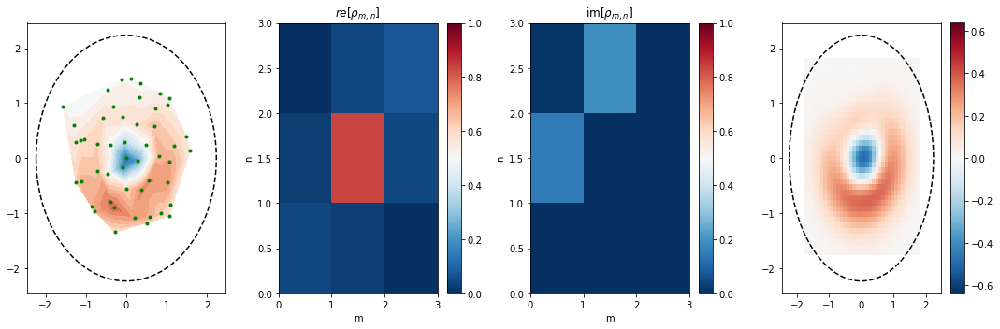

In [219]:
expt_name = 'wigner_tomo_binary_decomp'
filelist = [8]  # 190 is g0 for normalization
mode_state_num = 4

one_pops_snap = []

for ii,i in enumerate(filelist[:]):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ps = np.array(a['res'])
        Ws = -2/np.pi*(2*Ps-1)
        x = np.array(a['alphax'])[:]
        y = np.array(a['alphay'])[:]

        alphas = x+1j*y
                
        print(len(Ps))
        alphas2 = arange(-np.sqrt(7)/np.sqrt(2)+0.1,np.sqrt(7)/np.sqrt(2),0.1)
    
        w = gen_wigner_tomography_analysis(alphas, mode_state_num=mode_state_num,analytic=True)

        fig1 = plt.figure(figsize=(15,5))

        
        W = Ws 
        
        ax1 = fig1.add_subplot(141)
#         ax1.tripcolor(x,y,W)
        tcf = ax1.tricontourf(x, y, W, np.linspace(-2/np.pi, 2/np.pi, 30), cmap='RdBu_r')
        ax1.plot(x, y, 'g. ')
        r = sqrt(5)
        th = linspace(-3.14, 3.14, 100)
        ax1.plot(r*np.cos(th),r*np.sin(th),'k--')

        rho = w.rho_pinv_positive_sd(W)
#             rho = w.rho_pinv(W)
#         print(Qobj(rho))
        print ("Trace = ",trace(rho))
#         print (eig(rho)[0])
#         print (array([rho[i][i] for i in range(mode_state_num)]))
        print("0 population: ", rho[0][0])
        print("1 population: ", rho[1][1])
        one_pops_snap.append(rho[1][1])
        print("2 population: ", rho[2][2])
        print("sum 0 + 1: ", rho[0][0] + rho[1][1])

#         P_ns.append([rho[i][i] for i in range(mode_state_num)])

        ax2 = fig1.add_subplot(142,title ='$re[\\rho_{m,n}$]')
        c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),real(rho),cmap = 'RdBu_r',vmin = 0,vmax = 1)   
        ax2.set_ylabel('n')
        ax2.set_xlabel('m')
        fig1.colorbar(c,ax=ax2)
        ax2 = fig1.add_subplot(143,title ='im[$\\rho_{m,n}$]')
        c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),imag(rho),cmap = 'RdBu_r',vmin = 0,vmax = 1)   
        ax2.set_ylabel('n')
        ax2.set_xlabel('m')
        fig1.colorbar(c,ax=ax2)
        ax3 = fig1.add_subplot(144)
#             dx = (alphas2[1]-alphas2[0])
        c = ax3.pcolormesh(alphas2,alphas2,real(w.extracted_W(rho,alphas2,alphas2)),cmap = 'RdBu_r',vmin = -2/np.pi,vmax = 2/np.pi)
        r = sqrt(5)
        th = linspace(-3.14,3.14,100)
        ax3.plot(r*cos(th),r*sin(th),'k--')
        ax3.set_ylim
        fig1.colorbar(c,ax=ax3)

        fig1.tight_layout()

In [276]:
rho

array([[ 0.04617174+1.10588622e-17j,  0.02369809-1.45349815e-01j,
        -0.01141712-9.89324731e-03j,  0.01519619-1.15598669e-02j],
       [ 0.02369809+1.45349815e-01j,  0.83624685+1.39802204e-16j,
         0.04455683-1.88126910e-01j,  0.06035717+4.98924476e-02j],
       [-0.01141712+9.89324731e-03j,  0.04455683+1.88126910e-01j,
         0.07085138+5.89534931e-18j, -0.01534859+3.81137077e-03j],
       [ 0.01519619+1.15598669e-02j,  0.06035717-4.98924476e-02j,
        -0.01534859-3.81137077e-03j,  0.04673004+8.34110936e-18j]])

## OCT Pulse

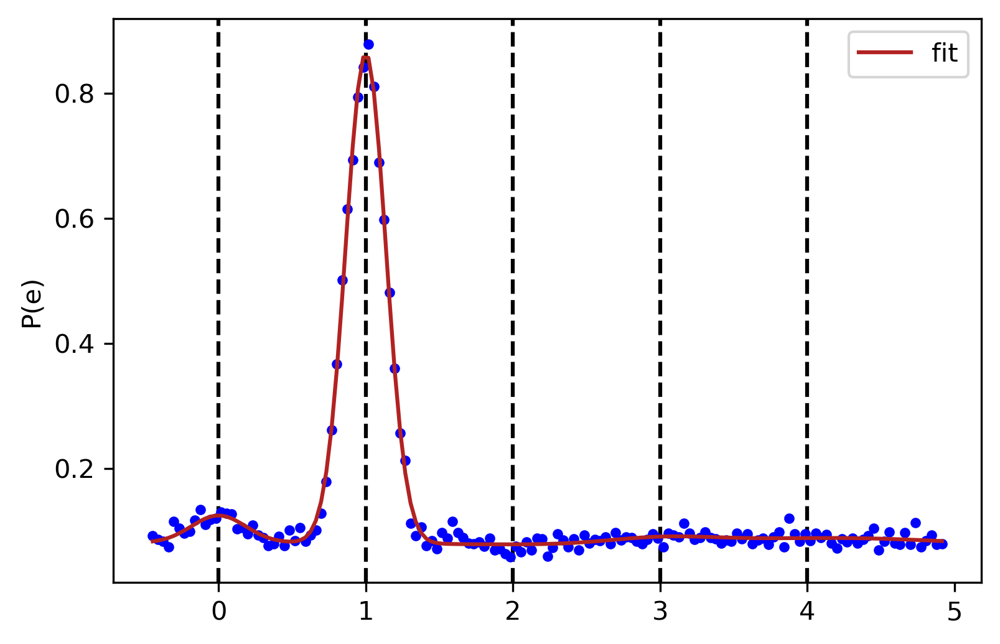

In [311]:
expt_name = 'oct_fock'
filelist = [2]

N = 5
contrast = [0.9525, 0.013]

two_chi_meas = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        two_chi = a['two_chi']
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
        x = freqs
        """Scaling the probability values with g and e"""
        y = (Q - contrast[1])/contrast[0]
        
        plt.figure(dpi=300)

        for j in range(N):
            plt.axvline(x=j, linestyle='--', color='k')
        plt.plot(x, y, '.', color='b') 
        
        fitparams = np.zeros(3*N+1)
        fitparams[0] = 0

        for kk in range(N):
            fitparams[3*kk+1] = max(y)
            fitparams[3*kk+2] = kk
            fitparams[3*kk+3] = 0.3

        p1, p2 = fitgausssum_with_baseline(x, y, fitparams=fitparams)
        
        plt.plot(x[::-1], gaussfuncsum_with_baseline(x[::-1], *p1), 'firebrick', label='fit')
        peak_val, freq_val = fitamp(p1)        

        plt.ylabel('P(e)')
        plt.legend(loc='best')
        plt.show()

In [301]:
peak_val

[0.045380210167494196,
 0.7966507676662455,
 0.012524030744878952,
 2.7518426438538945,
 0.7263929689231952]

# Binary decomposition (BD)

## 2 bit

0.5 1200
0.5 1200
0.5 1600
0.5 1800
0.5 2000
0.25 2000
0.25 2000
0.5 1600
0.25 1000.0
0.25 1200.0
0.25 1400.0
0.25 1600.0
0.25 1800.0
0.25 2000.0
0.25 2200.0
0.25 2400.0
0.25 2600.0
0.25 2800.0
0.25 3000.0
0.25 3200.0
0.25 3200.0
0.5 400.0
0.5 600.0
0.5 800.0
0.5 1000.0
0.5 1200.0
0.5 1400.0
0.5 1600.0
0.5 1800.0


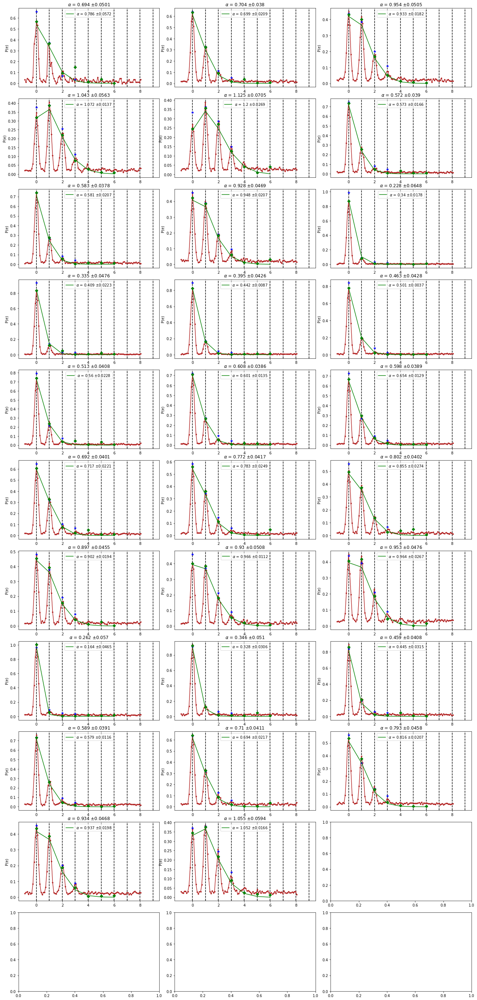

In [29]:
expt_name = 'binary_decomp_test'
filelist = np.arange(32)
# , 2, 3, 4, 7, 8, 10, 22
qubit_freq = 4.746910599438208
two_chi = -1.118e6
N = 7

contrast = [0.8795, 0.0015]

filelist = np.delete(filelist, -9)
filelist = np.delete(filelist, 6)
filelist = np.delete(filelist, 8)

alpha_binary = []
alpha_binary_err = []

alpha_respi = []
alpha_respi_err = []

fig, axs = plt.subplots(nrows=len(filelist)//3+len(filelist)%3, ncols=3, figsize=(18, 4*len(filelist)//3))
fig.tight_layout()

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        p_cav = np.array(a['p_cav'])/100
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
        print(cav_amp, cav_len)
        x = freqs
        """Scaling the probability values with g and e"""
        y = (Q - contrast[1])/contrast[0]
        p_cav = (p_cav-contrast[1])/contrast[0]

        ax = axs[ii//3, ii%3]

        for j in range(10):
            ax.axvline(x=j, linestyle='--', color='k')
        ax.plot(x, y, '.-', color='firebrick') 
        ax.plot(p_cav, 'b*')
        
        fitparams = np.zeros(3*N+1)
        fitparams[0] = 0

        for kk in range(N):
            fitparams[3*kk+1] = max(y)
            fitparams[3*kk+2] = kk
            fitparams[3*kk+3] = 0.3

        p1, p2 = fitgausssum_with_baseline(x, y, fitparams=fitparams)
                
        peak_val, freq_val = fitamp(p1)

        a, a_err = fitcoherentstate(peak_val)
        alpha_respi.append(a)
        alpha_respi_err.append(a_err)
        ax.plot(coherent_state(np.arange(len(peak_val)), a), 'g', label=r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
        ax.plot(peak_val,'gD')        
        a, a_err = fitcoherentstate(p_cav)
        alpha_binary.append(a)
        alpha_binary_err.append(a_err)
        ax.set_title(r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
        
        ax.set_ylabel('P(e)')
        ax.legend(loc='best')
plt.show()


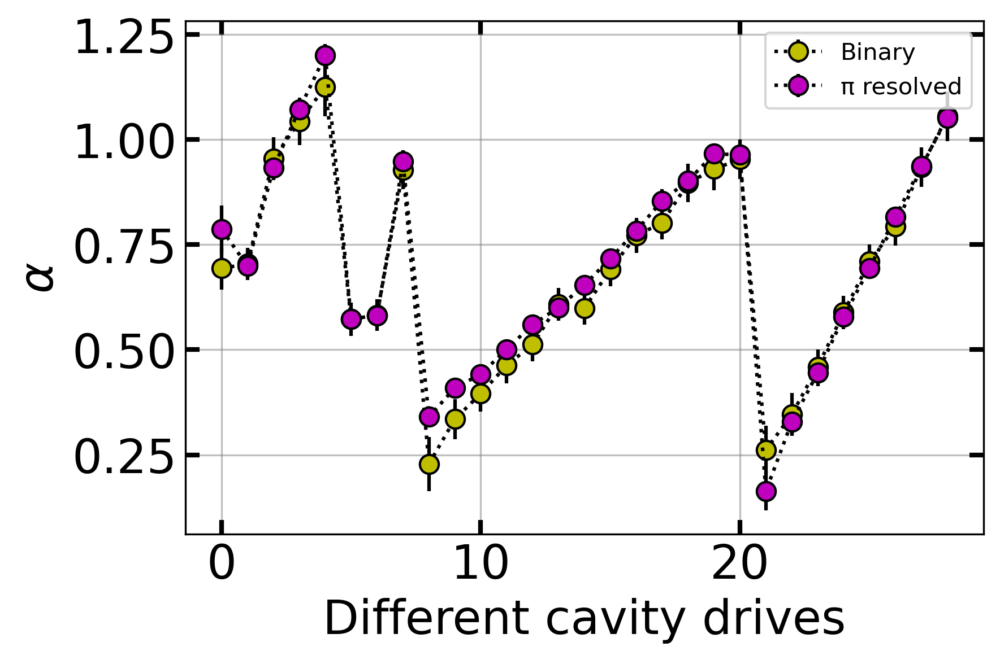

In [30]:
plt.figure(dpi=300)

y = np.array(alpha_binary)
y_err = np.array(alpha_binary_err)

plt.errorbar(x= np.arange(len(filelist)), y=y, yerr=y_err,  marker='o', markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='Binary')

y = np.array(alpha_respi)
y_err = np.array(alpha_respi_err)
plt.errorbar(x= np.arange(len(filelist)), y=y, yerr=y_err,  marker='o', markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='m', label='π resolved')

plt.ylabel(r'$\alpha$', fontsize=20)
plt.xlabel('Different cavity drives', fontsize=20)
plt.grid(minorticks_on)
plt.tick_params(direction='in', length=6, width=2, colors='k', \
        grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True)
plt.tight_layout()
plt.legend(loc='best')
# plt.title('Difference in α computed from binary decomposition and resolved qubit spectroscopy')
plt.show()

## 3 bit

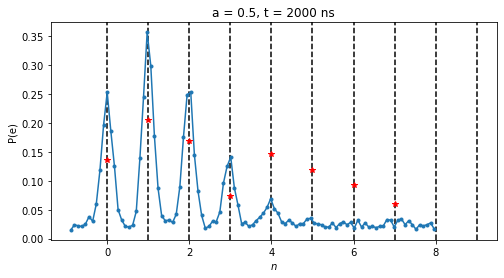

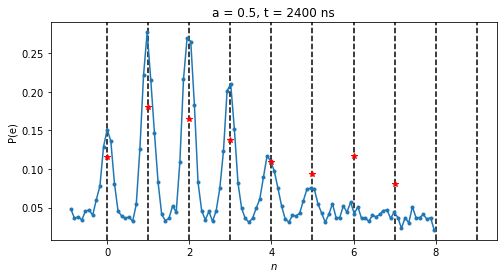

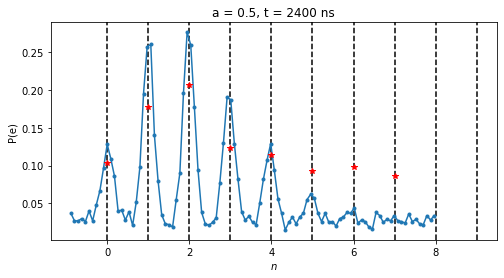

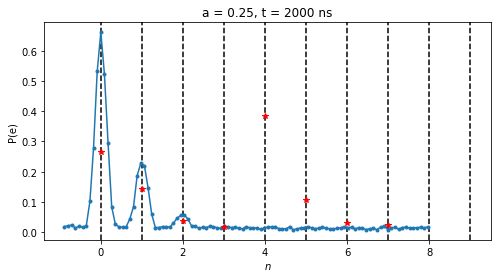

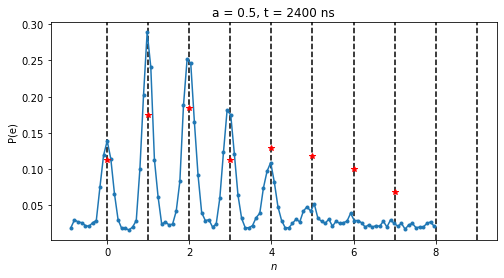

In [31]:
expt_name = 'binary_decomp_3bits_test'
filelist = [0, 1, 2, 3, 4]
qubit_freq = 4.746910599438208
two_chi = -1.13e6
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        p_cav = np.array(a['p_cav'])/100
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])

        a.close()
        
#         x = np.arange(0, n_max, len(Q))
        x = freqs
        y = Q
        plt.figure(figsize=(8, 4))
        for j in range(10):
            plt.axvline(x=j, linestyle='--', color='k')
        plt.plot(x, y, '.-')
        plt.title('a = {}, t = {} ns'.format(cav_amp, cav_len))

#         popt, pcov = curve_fit(coherent_state, x, y)
#         plt.title(r'$\alpha = %.3f$'%popt[1])
#         print(popt)
        plt.ylabel('P(e)')
        plt.xlabel(r'$n$')
        plt.plot(p_cav, 'r*')
#         plt.plot(x, coherent_state(x, *popt), 'r')
        plt.show()


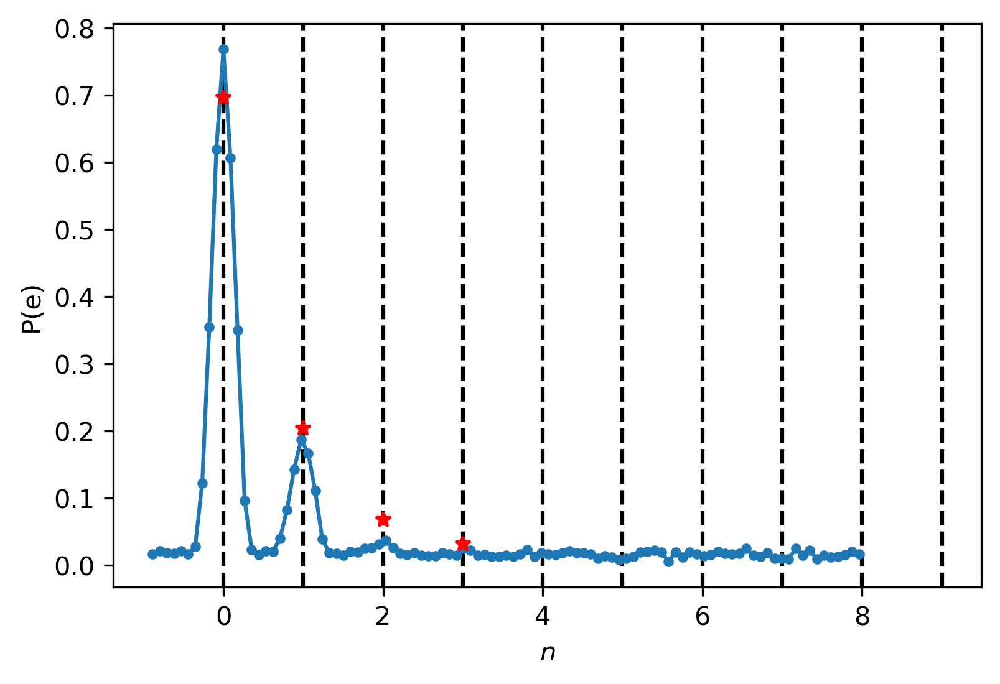

In [32]:
expt_name = 'number_splitting'
filelist = [33] #10 - binary_decomp
qubit_freq = 4.746910599438208
two_chi = -1.13e6
for ii, i in enumerate(filelist):
    filename = "S:\\_Data\\210326 - QM_OPX\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi

        a.close()
        
#         x = np.arange(0, n_max, len(Q))
        x = freqs
        y = Q
        plt.figure(dpi=300)
        for j in range(10):
            plt.axvline(x=j, linestyle='--', color='k')
        plt.plot(x, y, '.-')
#         popt, pcov = curve_fit(coherent_state, x, y)
#         plt.title(r'$\alpha = %.3f$'%popt[1])
#         print(popt)
        plt.ylabel('P(e)')
        plt.xlabel(r'$n$')
        p_cav = np.array([69.6, 20.4, 6.8, 3.2])/100
        plt.plot(p_cav, 'r*')
#         plt.plot(x, coherent_state(x, *popt), 'r')
        plt.show()


## 2 BD followed by repeated pi at n

In [327]:
expt_name = 'stim_em_bd_rp'
filelist = [8]
# 4 => n=0 
# 7 => n=1 SNAP
#8, n=1, with OCT
qubit_freq = 4.746910599438208
two_chi = -1.13e6
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        bit1 = np.array(a['bit1'])[:]
        bit2 = np.array(a['bit2'])[:]
        bit3 = pd.DataFrame(a['bit3'])[:]
        
        p_cav = np.array(a['p_cav'])/100
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])

        a.close()

print(np.shape(p_cav))
df = bit3
print(np.shape(df))

nx, ny = np.shape(df)

pd.set_option('display.max_rows', None)
l = []
for i in range(ny):
    l.append('π%i'%i)
df.columns = l

df['n'] = bit1+2*bit2

cols = df.columns.tolist()
cols = cols[-1:] + cols[:-1]
df = df[cols].sort_values(by=['n'])
# print(df)

(4,)
(10000, 40)


In [328]:
(unique, counts) = np.unique(df['n'], return_counts=True)


print(unique, counts)

[0 1 2 3] [1252 7343  669  736]


In [329]:
df.iloc[4000][:]

n      1
π0     0
π1     0
π2     0
π3     0
π4     0
π5     0
π6     0
π7     0
π8     0
π9     0
π10    0
π11    0
π12    0
π13    0
π14    0
π15    0
π16    0
π17    0
π18    0
π19    0
π20    0
π21    0
π22    0
π23    0
π24    0
π25    0
π26    0
π27    0
π28    1
π29    1
π30    1
π31    1
π32    1
π33    1
π34    1
π35    0
π36    0
π37    0
π38    0
π39    0
Name: 7651, dtype: int64

### debug

In [330]:
##----------------------------------------------------------------##
def forward( meas_seq, T, E):
    num_meas = len(meas_seq)
    N = T.shape[0]
    alpha = zeros((num_meas, N))
    pi = [0.25, 0.25, 0.25, 0.25]
    alpha[0] = pi*E[:,meas_seq[0]]
    for t in range(1, num_meas):
        alpha[t] = alpha[t-1].dot(T) * E[:, meas_seq[t]]
    return alpha

def backward( meas_seq, T, E):
    N = T.shape[0]
    num_meas = len(meas_seq)
    beta = zeros((N,num_meas))
    beta[:,-1:] = 1
    for t in reversed(range(num_meas-1)):
        for n in range(N):
            beta[n,t] = sum(beta[:,t+1] * T[n,:] * E[:, meas_seq[t+1]])
    return beta

def likelihood( meas_seq, T, E):
    # returns log P(Y  \mid  model)
    # using the forward part of the forward-backward algorithm
    return  forward(meas_seq, T, E)[-1].sum()

def gamma( meas_seq, T, E):
    alpha = forward(meas_seq, T, E)
    beta  = backward(meas_seq, T, E)
    obs_prob = likelihood(meas_seq, T, E)
    return (multiply(alpha, beta.T) / obs_prob)

def viterbi(meas_seq, T, E):
    # returns the most likely state sequence given observed sequence x
    # using the Viterbi algorithm
    num_meas = len(meas_seq)
    N = T.shape[0]
    delta = zeros((num_meas, N))
    psi = zeros((num_meas, N))
    pi = [0.25,0.25,0.25,0.25]
    delta[0] = pi*E[:,meas_seq[0]]
    for t in range(1, num_meas):
        for j in range(N):
            delta[t,j] = max(delta[t-1]*T[:,j]) * E[j, meas_seq[t]]
            psi[t,j] = argmax(delta[t-1]*T[:,j])

    # backtrack
    states = zeros(num_meas, dtype=int32)
    states[num_meas-1] = argmax(delta[num_meas-1])
    for t in range(num_meas-2, -1, -1):
        states[t] = psi[t+1, states[t+1]]
    return states


qubit_params = {'t1':100, 't2':130, 'nth':5e-2}
cavity_params = {'t1':5e2, 'nth':0.001}
readout_params = {'length':3.2, 'trigger':7.2, 'pi_pulse':3}

qubit_t1 = qubit_params['t1']
qubit_t2 = qubit_params['t2']
qubit_nth = qubit_params['nth']
cavity_t1 = cavity_params['t1']
cavity_nth = cavity_params['nth']

readout_len = readout_params['length']        
trigger_period = readout_params['trigger']
pi_length = readout_params['pi_pulse']

"""Readout fidelities from an independent measurement"""
g_infidelity, e_infidelity = 0.0194, 0.06647

fstate_in = 0

if fstate_in == 0:
    cavity_t1 = cavity_t1/1
    Pnm =  cavity_nth * (1-np.exp(-trigger_period/cavity_t1))
else:
    cavity_t1 = cavity_t1/fstate_in
    Pnm =  (1-np.exp(-trigger_period/cavity_t1)) + cavity_nth * (1-np.exp(-strigger_period/cavity_t1))

Pmn = 0 + 0 #assuming that the population at (n+1) is negligible and (n-1) we will estimate\
Pge = qubit_nth * (1-np.exp(-trigger_period/qubit_t1)) +\
    (1-np.exp(-pi_length/qubit_t2))
Peg = (1-np.exp(-trigger_period/qubit_t1)) + \
    (1-np.exp(-pi_length/qubit_t2))

T = asarray([[(1-Pmn)*(1-Pge), (1-Pmn)*Pge, Pmn*Pge, Pmn*(1-Pge)],
     [(1-Pmn)*Peg, (1-Pmn)*(1-Peg), Pmn*(1-Peg), Pmn*Peg],
     [Pnm*(1-Pge), Pnm*Pge, (1-Pnm)*Pge, (1-Pnm)*(1-Pge)],
     [Pnm*Peg, Pnm*(1-Peg), (1-Pnm)*(1-Peg), (1-Pnm)*Peg]])

E = 0.5*asarray([[1-g_infidelity, g_infidelity],
    [e_infidelity, 1- e_infidelity],
    [1-g_infidelity, g_infidelity],
    [e_infidelity, 1- e_infidelity]])

meas_seq = df.iloc[4000][1:1+npi_m]
P0_last = []
P1_last = []
print(len(meas_seq))

p_temp = []

for kk in range (len(meas_seq)):
    temp_meas_sequence = meas_seq[0:kk+1]
    gamma_matrix = gamma(temp_meas_sequence, T, E)
    P0_last.append(gamma_matrix[-1,0] + gamma_matrix[-1,1])
    P1_last.append(gamma_matrix[-1,2] + gamma_matrix[-1,3])

6


In [334]:
npi_m, npi_n

(6, 20)

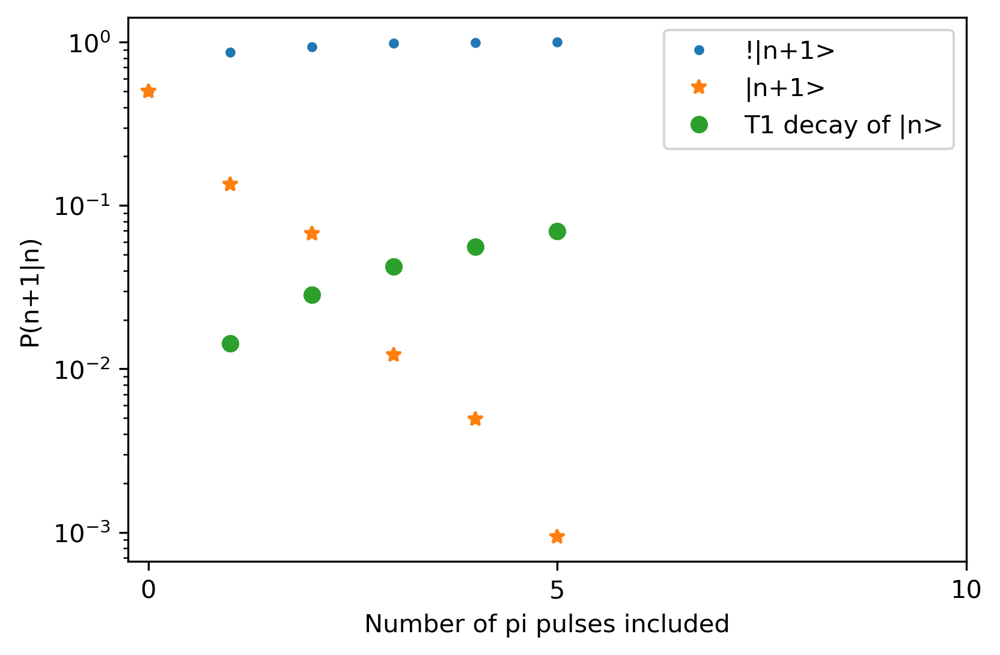

In [332]:
"""### Threshold analysis to estimate the number of pi pulses to be included for < detector based errors"""
plt.figure(dpi=300)

n = np.arange(npi_m)
t1_err = (1-np.exp(-n*trigger_period/cavity_t1))

plt.semilogy(np.array(P0_last), '.', label='!|n+1>')
plt.semilogy(np.array(P1_last), '*', label='|n+1>')
plt.semilogy(t1_err, 'o', label='T1 decay of |n>')
# plt.semilogy(1-t1_err, 'D', label='1-T1')

plt.xticks([0, 5, 10])
plt.ylabel('P(n+1|n)')
plt.xlabel('Number of pi pulses included')
plt.legend(loc='best')
plt.show()

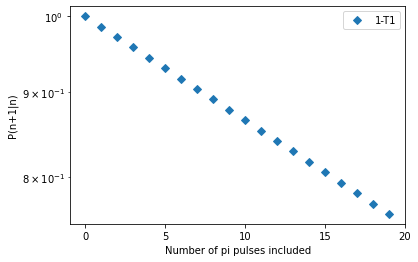

In [239]:
plt.semilogy(1-t1_err, 'D', label='1-T1')

plt.xticks([0, 5, 10, 15, 20])
plt.ylabel('P(n+1|n)')
plt.xlabel('Number of pi pulses included')
plt.legend(loc='best')
plt.show()

In [243]:
1-np.exp(-100/600)

0.15351827510938587

In [181]:
class hmm_analysis:

    def __init__(self, qubit_params = None, cavity_params = None, readout_params = None):
        
        self.qubit_params = qubit_params
        self.cavity_params = cavity_params
        self.readout_params = readout_params

        """All the timescales are in μs"""
        self.qubit_t1 = qubit_params['t1']
        self.qubit_t2 = qubit_params['t2']
        self.qubit_nth = qubit_params['nth']
        
        self.cavity_t1 = cavity_params['t1']
        self.cavity_nth = cavity_params['nth']
        
        self.readout_len = readout_params['length']        
        self.trigger_period = readout_params['trigger']
        self.pi_length = readout_params['pi_pulse']

    ##----------------------------------------------------------------##
    def forward(self, meas_seq, T, E):
        num_meas = len(meas_seq)
        N = T.shape[0]
        alpha = zeros((num_meas, N))
        pi = [0.25, 0.25, 0.25, 0.25]
        alpha[0] = pi*E[:,meas_seq[0]]
        for t in range(1, num_meas):
            alpha[t] = alpha[t-1].dot(T) * E[:, meas_seq[t]]
        return alpha

    def backward(self, meas_seq, T, E):
        N = T.shape[0]
        num_meas = len(meas_seq)
        beta = zeros((N,num_meas))
        beta[:,-1:] = 1
        for t in reversed(range(num_meas-1)):
            for n in range(N):
                beta[n,t] = sum(beta[:,t+1] * T[n,:] * E[:, meas_seq[t+1]])
        return beta

    def likelihood(self, meas_seq, T, E):
        # returns log P(Y  \mid  model)
        # using the forward part of the forward-backward algorithm
        return  self.forward(meas_seq, T, E)[-1].sum()

    def gamma(self, meas_seq, T, E):
        alpha = self.forward(meas_seq, T, E)
        beta  = self.backward(meas_seq, T, E)
        obs_prob = self.likelihood(meas_seq, T, E)
        return (multiply(alpha, beta.T) / obs_prob)

    def viterbi(self, meas_seq, T, E):
        # returns the most likely state sequence given observed sequence x
        # using the Viterbi algorithm
        num_meas = len(meas_seq)
        N = T.shape[0]
        delta = zeros((num_meas, N))
        psi = zeros((num_meas, N))
        pi = [0.25,0.25,0.25,0.25]
        delta[0] = pi*E[:,meas_seq[0]]
        for t in range(1, num_meas):
            for j in range(N):
                delta[t,j] = max(delta[t-1]*T[:,j]) * E[j, meas_seq[t]]
                psi[t,j] = argmax(delta[t-1]*T[:,j])

        # backtrack
        states = zeros(num_meas, dtype=int32)
        states[num_meas-1] = argmax(delta[num_meas-1])
        for t in range(num_meas-2, -1, -1):
            states[t] = psi[t+1, states[t+1]]
        return states
    ##----------------------------------------------------------------##
    def openfile(self, filename):
        
        return File(filename,'r')

    def stateprep(self, data_filename):
        
        """Readout fidelities from an independent measurement"""
        g_infidelity, e_infidelity = 0.0198, 0.0694
        
        self.a = self.openfile(data_filename)

        bit1 = np.array(self.a['bit1'])[:]
        bit2 = np.array(self.a['bit2'])[:]
        bit3 = pd.DataFrame(self.a['bit3'])[:]
        
        p_cav = np.array(self.a['p_cav'])/100
        cav_amp = np.array(self.a['amp'])
        cav_len = np.array(self.a['time'])
        
        self.a.close()
        
        df = bit3
        
        nx, ny = np.shape(df)
        
        npi_at_n = ny
        npi_at_m = 0
        
        """Renaming the columns of repeated pi pulses"""
        l = []
        for i in range(ny):
            l.append('π%i'%i)
        df.columns = l

        df.columns = l

        df['n'] = bit1+2*bit2

        cols = df.columns.tolist()
        cols = cols[-1:] + cols[:-1]
        df = df[cols].sort_values(by=['n'])

        """Find out the unique Fock levels and their occureneces"""

        (unique, counts) = np.unique(df['n'], return_counts=True)

        p_counts = []
        
        index = 0
        for ii in range(len(unique)):
            p_temp = []
            fstate_in = unique[ii]

            if fstate_in == 0:
                cavity_t1 = self.cavity_t1/1
                Pnm =  self.cavity_nth * (1-np.exp(-self.trigger_period/cavity_t1))
            else:
                cavity_t1 = self.cavity_t1/fstate_in
                Pnm =  (1-np.exp(-self.trigger_period/cavity_t1)) + self.cavity_nth * (1-np.exp(-self.trigger_period/cavity_t1))

            Pmn = 0 + 0 #assuming that the population at (n+1) is negligible and (n-1) we will estimate\
            Pge = self.qubit_nth * (1-np.exp(-self.trigger_period/self.qubit_t1)) +\
                (1-np.exp(-self.pi_length/self.qubit_t2))
            Peg = (1-np.exp(-self.trigger_period/self.qubit_t1)) + \
                (1-np.exp(-self.pi_length/self.qubit_t2))

            T = asarray([[(1-Pmn)*(1-Pge), (1-Pmn)*Pge, Pmn*Pge, Pmn*(1-Pge)],
                 [(1-Pmn)*Peg, (1-Pmn)*(1-Peg), Pmn*(1-Peg), Pmn*Peg],
                 [Pnm*(1-Pge), Pnm*Pge, (1-Pnm)*Pge, (1-Pnm)*(1-Pge)],
                 [Pnm*Peg, Pnm*(1-Peg), (1-Pnm)*(1-Peg), (1-Pnm)*Peg]])

            E = 0.5*asarray([[1-g_infidelity, g_infidelity],
                [e_infidelity, 1- e_infidelity],
                [1-g_infidelity, g_infidelity],
                [e_infidelity, 1- e_infidelity]])
            
            for jj in range(counts[ii]):
                meas_seq = df.iloc[index + jj][1:]
                P0_first = []
                P1_first = []
                gamma_matrix = self.gamma(meas_seq, T, E)
                P0_first.append(gamma_matrix[-1,0] + gamma_matrix[-1,1])
                P1_first.append(gamma_matrix[-1,2] + gamma_matrix[-1,3])    
                p_temp.append(P1_first[-1]/P0_first[-1])
            
            index = index + counts[ii]
            p_counts.append(p_temp)
        print(unique, counts)
        return unique, counts, p_counts

In [182]:
qubit_params = {'t1':100, 't2':130, 'nth':5e-2}
cavity_params = {'t1':5e2, 'nth':0.001}
readout_params = {'length':3.2, 'trigger':7.2, 'pi_pulse':3}
expt_name = 'binary_decomp_repeated_pi'
filelist = [20]

p_counts = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    obj = hmm_analysis(qubit_params=qubit_params, cavity_params=cavity_params, readout_params=readout_params)
    unique, counts, p_counts = obj.stateprep(data_filename=filename)

[0 1 2 3] [4000 3332 1843  825]


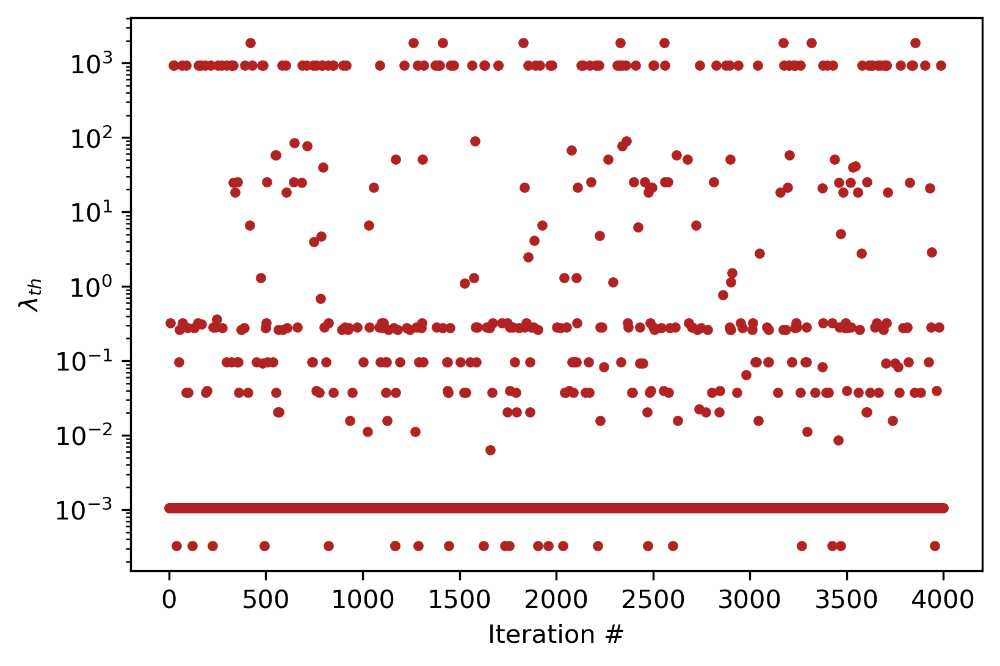

0.0055


In [183]:
plt.figure(dpi=300)
plt.plot(p_counts[0], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[0]):
    if p < 1e-3:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[0]))

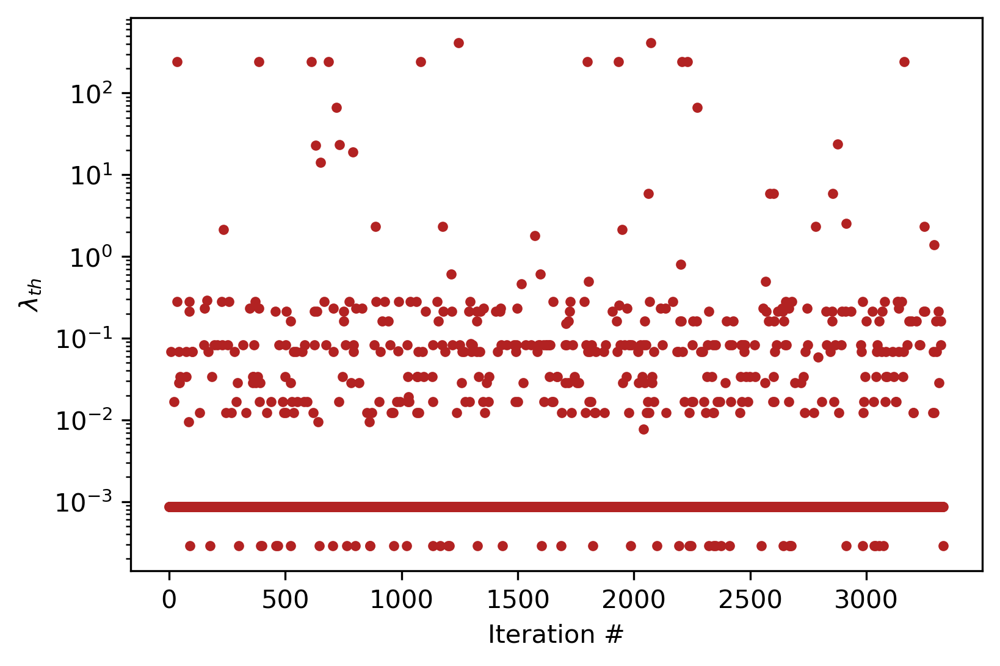

0.003601440576230492


In [38]:
plt.figure(dpi=300)
plt.plot(p_counts[1], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[1]):
    if p > 1e2:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[1]))

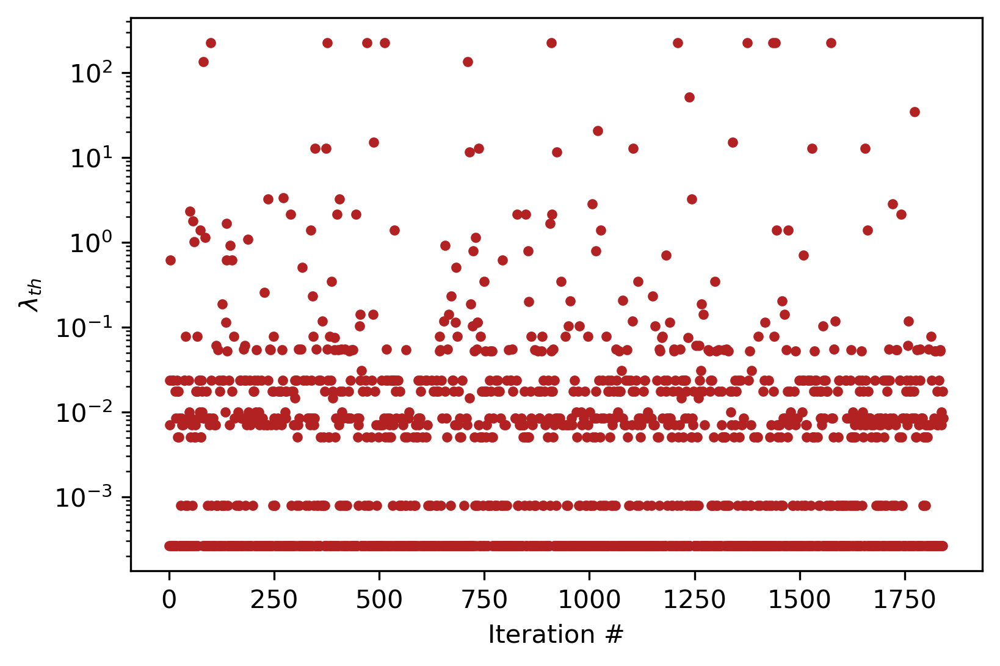

0.0065111231687466084


In [39]:
plt.figure(dpi=300)
plt.plot(p_counts[2], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[2]):
    if p > 1e2:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[2]))

# Stim Em Test

In [184]:
expt_name = 'stim_em_bd_rp'
filelist = [0]
qubit_freq = 4.746910599438208
two_chi = -1.13e6
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        bit1 = np.array(a['bit1'])[:]
        bit2 = np.array(a['bit2'])[:]
        bit3 = pd.DataFrame(a['bit3'])[:]
        
        p_cav = np.array(a['p_cav'])/100
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        npi_m = int(np.array(a['pi_m']))
        npi_n = int(np.array(a['pi_n']))

        a.close()

print(np.shape(p_cav))
df = bit3
print(np.shape(df))

nx, ny = np.shape(df)

pd.set_option('display.max_rows', None)
l = []
for i in range(ny):
    l.append('π%i'%i)
df.columns = l

df['n'] = bit1+2*bit2

cols = df.columns.tolist()
cols = cols[-1:] + cols[:-1]
df = df[cols].sort_values(by=['n'])
# print(df)

(4,)
(1000, 26)


In [185]:
class hmm_analysis:

    def __init__(self, qubit_params = None, cavity_params = None, readout_params = None):
        
        self.qubit_params = qubit_params
        self.cavity_params = cavity_params
        self.readout_params = readout_params

        """All the timescales are in μs"""
        self.qubit_t1 = qubit_params['t1']
        self.qubit_t2 = qubit_params['t2']
        self.qubit_nth = qubit_params['nth']
        
        self.cavity_t1 = cavity_params['t1']
        self.cavity_nth = cavity_params['nth']
        
        self.readout_len = readout_params['length']        
        self.trigger_period = readout_params['trigger']
        self.pi_length = readout_params['pi_pulse']

    ##----------------------------------------------------------------##
    def forward(self, meas_seq, T, E):
        num_meas = len(meas_seq)
        N = T.shape[0]
        alpha = zeros((num_meas, N))
        pi = [0.25, 0.25, 0.25, 0.25]
        alpha[0] = pi*E[:,meas_seq[0]]
        for t in range(1, num_meas):
            alpha[t] = alpha[t-1].dot(T) * E[:, meas_seq[t]]
        return alpha

    def backward(self, meas_seq, T, E):
        N = T.shape[0]
        num_meas = len(meas_seq)
        beta = zeros((N,num_meas))
        beta[:,-1:] = 1
        for t in reversed(range(num_meas-1)):
            for n in range(N):
                beta[n,t] = sum(beta[:,t+1] * T[n,:] * E[:, meas_seq[t+1]])
        return beta

    def likelihood(self, meas_seq, T, E):
        # returns log P(Y  \mid  model)
        # using the forward part of the forward-backward algorithm
        return  self.forward(meas_seq, T, E)[-1].sum()

    def gamma(self, meas_seq, T, E):
        alpha = self.forward(meas_seq, T, E)
        beta  = self.backward(meas_seq, T, E)
        obs_prob = self.likelihood(meas_seq, T, E)
        return (multiply(alpha, beta.T) / obs_prob)

    def viterbi(self, meas_seq, T, E):
        # returns the most likely state sequence given observed sequence x
        # using the Viterbi algorithm
        num_meas = len(meas_seq)
        N = T.shape[0]
        delta = zeros((num_meas, N))
        psi = zeros((num_meas, N))
        pi = [0.25,0.25,0.25,0.25]
        delta[0] = pi*E[:,meas_seq[0]]
        for t in range(1, num_meas):
            for j in range(N):
                delta[t,j] = max(delta[t-1]*T[:,j]) * E[j, meas_seq[t]]
                psi[t,j] = argmax(delta[t-1]*T[:,j])

        # backtrack
        states = zeros(num_meas, dtype=int32)
        states[num_meas-1] = argmax(delta[num_meas-1])
        for t in range(num_meas-2, -1, -1):
            states[t] = psi[t+1, states[t+1]]
        return states
    ##----------------------------------------------------------------##
    def openfile(self, filename):
        
        return File(filename,'r')

    def stateprep(self, data_filename):
        
        """Readout fidelities from an independent measurement"""
        g_infidelity, e_infidelity = 0.0198, 0.0694
        
        self.a = self.openfile(data_filename)

        bit1 = np.array(self.a['bit1'])[:]
        bit2 = np.array(self.a['bit2'])[:]
        bit3 = pd.DataFrame(self.a['bit3'])[:]
        
        p_cav = np.array(self.a['p_cav'])/100
        cav_amp = np.array(self.a['amp'])
        cav_len = np.array(self.a['time'])
        npi_m = int(np.array(self.a['pi_m']))
        npi_n = int(np.array(self.a['pi_n']))

        self.a.close()
        
        df = bit3
        
        nx, ny = np.shape(df)
                
        """Renaming the columns of repeated pi pulses"""
        l = []
        for i in range(ny):
            l.append('π%i'%i)
        df.columns = l

        df.columns = l

        df['n'] = bit1+2*bit2

        cols = df.columns.tolist()
        cols = cols[-1:] + cols[:-1]
        df = df[cols].sort_values(by=['n'])

        """Find out the unique Fock levels and their occureneces"""

        (unique, counts) = np.unique(df['n'], return_counts=True)

        p_m_counts = []
        p_n_counts = []
        
        index = 0
        for ii in range(len(unique)):
            p_temp = []
            fstate_in = unique[ii]+1

            cavity_t1 = self.cavity_t1/fstate_in
            Pnm =  (1-np.exp(-self.trigger_period/cavity_t1)) + self.cavity_nth * (1-np.exp(-self.trigger_period/cavity_t1))

            Pmn = 0 + 0 #assuming that the population at (n+1) is negligible and (n-1) we will estimate\
            Pge = self.qubit_nth * (1-np.exp(-self.trigger_period/self.qubit_t1)) +\
                (1-np.exp(-self.pi_length/self.qubit_t2))
            Peg = (1-np.exp(-self.trigger_period/self.qubit_t1)) + \
                (1-np.exp(-self.pi_length/self.qubit_t2))

            T = asarray([[(1-Pmn)*(1-Pge), (1-Pmn)*Pge, Pmn*Pge, Pmn*(1-Pge)],
                 [(1-Pmn)*Peg, (1-Pmn)*(1-Peg), Pmn*(1-Peg), Pmn*Peg],
                 [Pnm*(1-Pge), Pnm*Pge, (1-Pnm)*Pge, (1-Pnm)*(1-Pge)],
                 [Pnm*Peg, Pnm*(1-Peg), (1-Pnm)*(1-Peg), (1-Pnm)*Peg]])

            E = 0.5*asarray([[1-g_infidelity, g_infidelity],
                [e_infidelity, 1- e_infidelity],
                [1-g_infidelity, g_infidelity],
                [e_infidelity, 1- e_infidelity]])
            
            for jj in range(counts[ii]):
                meas_seq = df.iloc[index + jj][1:1+npi_m]
                P0_first = []
                P1_first = []
                gamma_matrix = self.gamma(meas_seq, T, E)
                P0_first.append(gamma_matrix[-1,0] + gamma_matrix[-1,1])
                P1_first.append(gamma_matrix[-1,2] + gamma_matrix[-1,3])    
                p_temp.append(P1_first[-1]/P0_first[-1])
            
            index = index + counts[ii]
            p_m_counts.append(p_temp)
        print(unique, counts)
        return unique, counts, p_m_counts

In [188]:
qubit_params = {'t1':100, 't2':130, 'nth':5e-2}
cavity_params = {'t1':5e2, 'nth':0.001}
readout_params = {'length':3.2, 'trigger':7.2, 'pi_pulse':3}
expt_name = 'stim_em_bd_rp'
filelist = [5]

p_counts = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    obj = hmm_analysis(qubit_params=qubit_params, cavity_params=cavity_params, readout_params=readout_params)
    unique, counts, p_counts = obj.stateprep(data_filename=filename)

[0 1 2 3] [91409  1888  4505  2198]


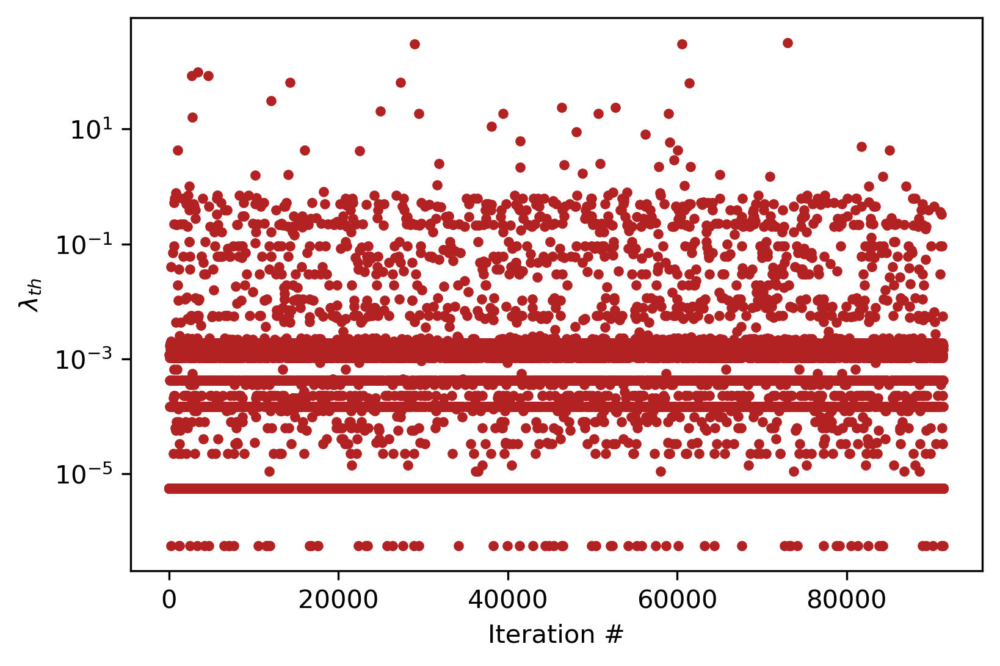

0.8865210209060377


In [192]:
plt.figure(dpi=300)
plt.plot(p_counts[0], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[0]):
    if p < 1e-5:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[0]))

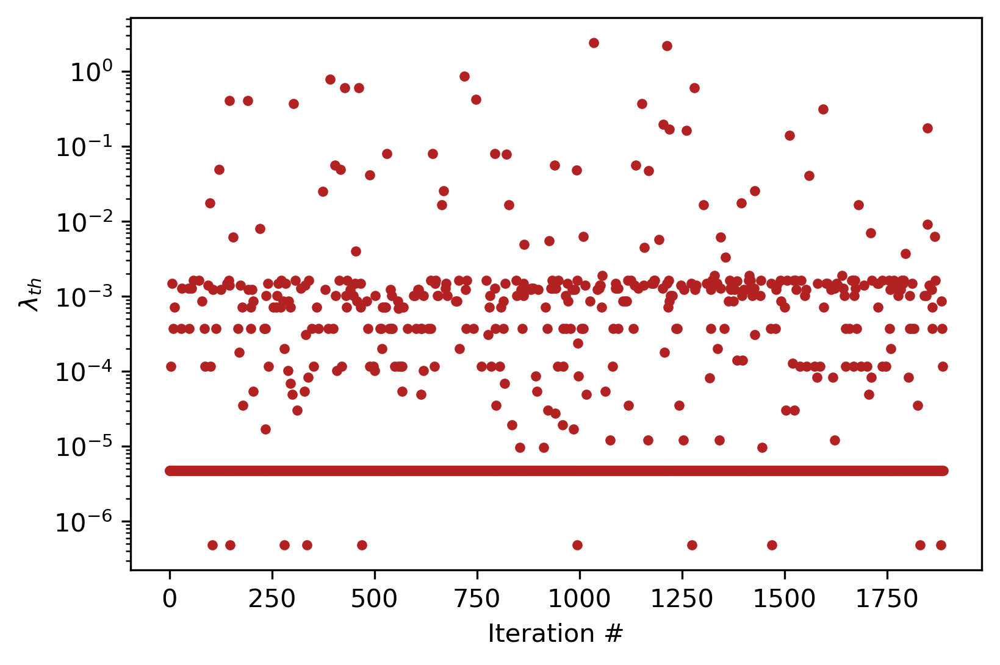

0.7786016949152542


In [193]:
plt.figure(dpi=300)
plt.plot(p_counts[1], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[1]):
    if p < 1e-5:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[1]))

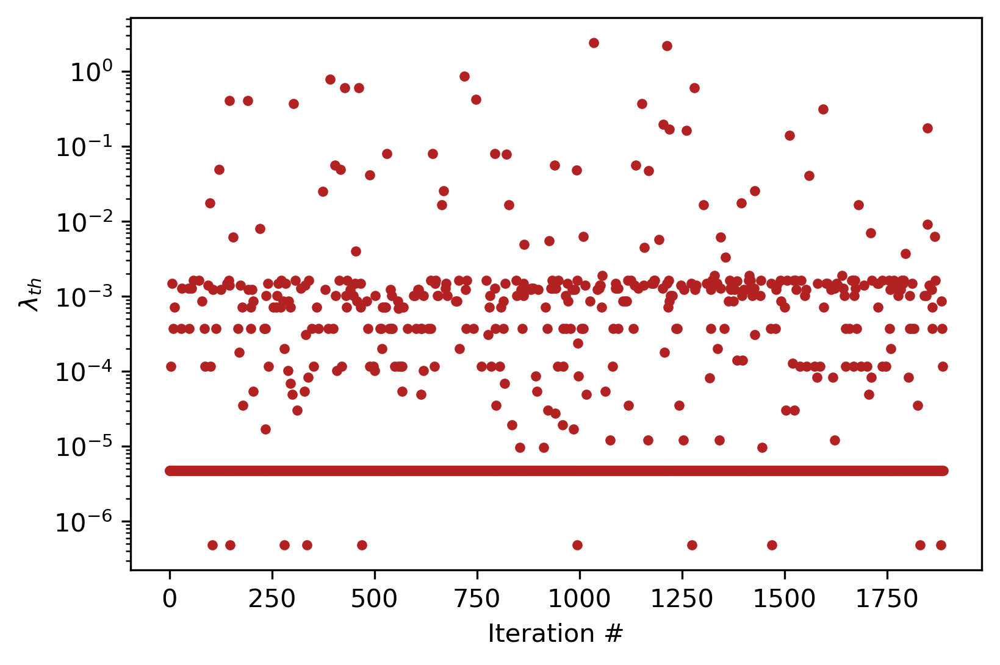

0.5267480577136515


In [195]:
plt.figure(dpi=300)
plt.plot(p_counts[1], '.', color='firebrick')
plt.ylabel(r'$\lambda_{th}$')
plt.xlabel('Iteration #')
plt.yscale('log')
plt.show()

x = []
for ii, p in enumerate(p_counts[2]):
    if p < 1e-5:
#         print(ii)
        x.append(ii)
    
print(len(x)/len(p_counts[2]))

In [203]:
num1 = array([1, 1, 1, ..., 1, 1, 3], dtype=int64)


TypeError: int() argument must be a string, a bytes-like object or a number, not 'ellipsis'